In [1]:
import os 
import datetime
from datetime import timedelta 
import time

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

sns.set_theme()
mpl.rcParams['figure.figsize']=(10,8)
mpl.rcParams['axes.grid']=True
%config InlineBackend.figure_format = 'retina'

# Data Wrangling
- Loading the dataset
- Data wrangling for missing variables.
- Data transformation.
- Data visualization

## Loading Dataset

In [2]:
#df = pd.read_excel('Data_B2_Aug22.xlsx',sheet_name='Data GT21',index_col='Time',parse_dates=True)  #for Local Repository

PATH = 'https://raw.githubusercontent.com/WisitTee/Thesis/main/Data_GT21_Aug22.csv'
df = pd.read_csv(PATH,index_col='Time',parse_dates=True)
df.head(5)

,GT21_GEN_WATT,GT21_GEN_VAR,GT21_GEN_CURRENT,GT21_GEN_VOLTAGE,GT21_PWR_FACTOR,GT21_FUEL_GAS_PRESS,GT21_CSO,GT21_SPEED,GT21_IGV_CSO,GT21_IGV_FB,...,GT21_FG_DIFF_PRESS,GT21_INLET_AIR_DIFF_KKU,GT21_NOX_7O2,HG21_IN_GAS_PRESS,HG21_OUT_GAS_PRESS,HG21_IN_GAS_TEMP,HG21_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY
Time,,,,,,,,,,,,,,,,,,,,,
2022-08-01 16:22:00,78.92,22.40,3.35,14.01,0.96,22.92,49.97,3000.75,4.63,3.74,...,2483.30,17.71,242.22,150.31,9.48,543.70,112.31,94.25,30.10,74.51
2022-08-01 16:23:00,78.88,22.68,3.36,14.01,0.95,22.92,49.95,3000.38,4.71,4.59,...,2492.74,17.54,240.67,140.53,8.40,543.36,112.36,94.38,30.04,74.86
2022-08-01 16:24:00,78.90,22.16,3.35,14.00,0.96,22.92,49.95,3002.25,4.24,4.50,...,2478.27,17.67,239.45,144.53,8.80,542.91,112.41,94.38,30.05,74.98
2022-08-01 16:25:00,78.88,22.60,3.35,14.01,0.96,22.93,49.93,2999.63,4.28,4.48,...,2483.74,17.37,240.33,134.33,9.47,542.85,112.47,94.25,30.04,74.97
2022-08-01 16:26:00,78.88,24.80,3.37,14.07,0.95,22.94,49.96,3003.00,3.48,3.18,...,2477.31,17.84,239.39,134.27,7.92,543.25,112.47,94.50,30.05,73.93


## Checking Missing Value  & Data Distributions

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39115 entries, 2022-08-01 16:22:00 to 2022-08-31 23:59:00
Data columns (total 46 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   GT21_GEN_WATT            39115 non-null  float64
 1   GT21_GEN_VAR             39115 non-null  float64
 2   GT21_GEN_CURRENT         39115 non-null  float64
 3   GT21_GEN_VOLTAGE         39115 non-null  float64
 4   GT21_PWR_FACTOR          39115 non-null  float64
 5   GT21_FUEL_GAS_PRESS      39115 non-null  float64
 6   GT21_CSO                 39115 non-null  float64
 7   GT21_SPEED               39115 non-null  float64
 8   GT21_IGV_CSO             39115 non-null  float64
 9   GT21_IGV_FB              39115 non-null  float64
 10  GT21_EXH_DAMPER_CMD      39115 non-null  float64
 11  GT21_EXH_DAMPER_FB       39115 non-null  float64
 12  GT21_COMP_IN_AIR_TEMP    39115 non-null  float64
 13  GT21_RCA_TEMP_R          39115 non-null  

In [4]:
pd.set_option('display.max_columns', None) #to preview all columns
df.describe()

,GT21_GEN_WATT,GT21_GEN_VAR,GT21_GEN_CURRENT,GT21_GEN_VOLTAGE,GT21_PWR_FACTOR,GT21_FUEL_GAS_PRESS,GT21_CSO,GT21_SPEED,GT21_IGV_CSO,GT21_IGV_FB,GT21_EXH_DAMPER_CMD,GT21_EXH_DAMPER_FB,GT21_COMP_IN_AIR_TEMP,GT21_RCA_TEMP_R,GT21_RCA_TEMP_L,GT21_DISC_TEMP2_R,GT21_DISC_TEMP2_L,GT21_DISC_TEMP3_R,GT21_DISC_TEMP3_L,GT21_DISC_TEMP4_R,GT21_DISC_TEMP4_L,GT21_BPT_AVG,GT21_EXH_GAS_TEMP_AVG,GT21_FUEL_GAS_FLOW,GT21_FUEL_GAS_SPLY_TEMP,GT21_STEAM_INJ_FLOW,GT21_WTR_INJ_FLOW,GT21_COMP_OUT_AIR_TEMP,GT21_COMB_PRESS,GT21_H2_W_GAS_TEMP33,GT21_H2_W_GAS_TEMP34,GT21_INJ_STEAM_TEMP,GT21_COMP_INDEX_PRESS,GT21_RAW_NOX,GT21_OXYGEN,GT21_INLET_AIR_FLOW,GT21_FG_DIFF_PRESS,GT21_INLET_AIR_DIFF_KKU,GT21_NOX_7O2,HG21_IN_GAS_PRESS,HG21_OUT_GAS_PRESS,HG21_IN_GAS_TEMP,HG21_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY
count,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.0,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000,39115.000000
mean,79.210594,15.372026,3.312224,13.881120,0.918654,22.997422,49.960483,2999.863064,5.134000,4.930304,100.0,102.672253,26.710791,188.096083,188.963698,359.011375,411.262631,327.516813,330.023080,382.125729,386.555173,554.454857,542.611749,28.171432,31.031598,3.917957,0.202813,369.068073,9.361866,45.273851,44.374325,422.722322,999.281554,98.168270,15.197484,324.429201,2494.403901,18.359870,239.266388,86.103700,9.520593,541.435356,112.485716,94.707734,28.552995,82.443538
std,5.320382,7.994889,0.231033,0.129446,0.325323,0.335868,0.960478,1.916954,8.952785,9.046172,0.0,0.291706,2.509853,5.616152,5.887713,5.206327,6.372679,5.935723,5.671598,10.833239,11.954644,12.675546,9.652163,1.257662,1.615484,1.412075,0.679415,6.270572,0.365038,0.495506,0.247275,87.169897,86.222220,3.991728,0.157168,139.052362,221.550904,1.257928,6.650720,27.889775,1.052932,9.169004,0.947447,3.430471,2.533679,9.519517
min,54.520000,-10.360000,2.240000,13.430000,-1.000000,22.090000,44.470000,2993.250000,0.000000,-3.010000,100.0,102.000000,22.070000,174.100000,174.980000,334.900000,364.080000,295.590000,300.850000,319.490000,328.510000,460.610000,474.290000,22.170000,25.800000,0.000000,0.000000,353.030000,8.570000,44.090000,43.410000,76.680000,915.510000,35.030000,14.810000,309.700000,1464.910000,16.590000,90.060000,26.090000,6.090000,475.700000,110.800000,73.750000,24.330000,47.540000
25%,78.460000,9.760000,3.260000,13.790000,0.960000,22.840000,49.850000,2998.500000,1.930000,1.750000,100.0,102.370000,24.720000,184.660000,185.280000,356.220000,410.360000,325.340000,327.440000,378.960000,378.475000,555.910000,544.580000,28.010000,30.000000,3.300000,0.000000,365.030000,9.260000,44.940000,44.250000,442.375000,970.230000,98.060000,15.150000,320.930000,2469.025000,17.800000,238.590000,63.785000,9.090000,542.710000,112.070000,94.500000,26.505000,75.320000
50%,78.840000,15.720000,3.290000,13.890000,0.980000,22.930000,49.990000,3000.000000,3.370000,3.280000,100.0,102.750000,26.190000,187.000000,187.870000,358.440000,411.770000,327.400000,329.370000,384.350000,387.150000,556.920000,544.910000,28.100000,30.610000,3.790000,0.000000,367.620000,9.310000,45.180000,44.340000,449.500000,982.530000,98.820000,15.170000,321.410000,2489.720000,18.070000,239.850000,84.660000,9.390000,543.600000,112.250000,94.880000,27.990000,85.720000
75%,79.680000,20.800000,3.340000,13.970000,0.990000,23.010000,50.110000,3001.500000,5.090000,5.020000,100.0,102.940000,28.710000,190.430000,191.420000,361.900000,413.880000,330.570000,333.190000,388.930000,395.380000,557.750000,545.110000,28.270000,32.070000,4.560000,0.000000,372.3

## Data Transformation 

In [5]:
#Average RCA and Discavity Temp
df['GT21_RCA_TEMP_AVG'] = (df['GT21_RCA_TEMP_R'] + df['GT21_RCA_TEMP_L']) / 2
df['GT21_DISC_TEMP2_AVG'] = (df['GT21_DISC_TEMP2_R'] + df['GT21_DISC_TEMP2_L']) / 2
df['GT21_DISC_TEMP3_AVG'] = (df['GT21_DISC_TEMP3_R'] + df['GT21_DISC_TEMP3_L']) / 2
df['GT21_DISC_TEMP4_AVG'] = (df['GT21_DISC_TEMP4_R'] + df['GT21_DISC_TEMP4_L']) / 2

### Drop the Unusual periods

In [6]:
#Water Injection Period
df = df.drop(df[df.GT21_WTR_INJ_FLOW > 0.5].index)
df = df.drop(df[df.GT21_STEAM_INJ_FLOW < 2.5].index)

#NOx Outlier Period
df = df.drop(df[df.GT21_NOX_7O2 < 200].index)
df = df.drop(df[df.GT21_NOX_7O2 > 300].index)

In [7]:
df.head()

,GT21_GEN_WATT,GT21_GEN_VAR,GT21_GEN_CURRENT,GT21_GEN_VOLTAGE,GT21_PWR_FACTOR,GT21_FUEL_GAS_PRESS,GT21_CSO,GT21_SPEED,GT21_IGV_CSO,GT21_IGV_FB,GT21_EXH_DAMPER_CMD,GT21_EXH_DAMPER_FB,GT21_COMP_IN_AIR_TEMP,GT21_RCA_TEMP_R,GT21_RCA_TEMP_L,GT21_DISC_TEMP2_R,GT21_DISC_TEMP2_L,GT21_DISC_TEMP3_R,GT21_DISC_TEMP3_L,GT21_DISC_TEMP4_R,GT21_DISC_TEMP4_L,GT21_BPT_AVG,GT21_EXH_GAS_TEMP_AVG,GT21_FUEL_GAS_FLOW,GT21_FUEL_GAS_SPLY_TEMP,GT21_STEAM_INJ_FLOW,GT21_WTR_INJ_FLOW,GT21_COMP_OUT_AIR_TEMP,GT21_COMB_PRESS,GT21_H2_W_GAS_TEMP33,GT21_H2_W_GAS_TEMP34,GT21_INJ_STEAM_TEMP,GT21_COMP_INDEX_PRESS,GT21_RAW_NOX,GT21_OXYGEN,GT21_INLET_AIR_FLOW,GT21_FG_DIFF_PRESS,GT21_INLET_AIR_DIFF_KKU,GT21_NOX_7O2,HG21_IN_GAS_PRESS,HG21_OUT_GAS_PRESS,HG21_IN_GAS_TEMP,HG21_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY,GT21_RCA_TEMP_AVG,GT21_DISC_TEMP2_AVG,GT21_DISC_TEMP3_AVG,GT21_DISC_TEMP4_AVG
Time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-08-01 16:22:00,78.92,22.40,3.35,14.01,0.96,22.92,49.97,3000.75,4.63,3.74,100.0,102.13,27.93,189.91,190.92,360.68,411.12,331.41,333.15,388.52,370.76,557.62,545.01,28.05,32.04,4.34,0.0,370.13,9.30,45.56,44.30,449.70,984.00,99.57,15.19,320.82,2483.30,17.71,242.22,150.31,9.48,543.70,112.31,94.25,30.10,74.51,190.415,385.900,332.280,379.640
2022-08-01 16:23:00,78.88,22.68,3.36,14.01,0.95,22.92,49.95,3000.38,4.71,4.59,100.0,102.13,27.86,189.91,190.87,360.67,410.92,331.36,333.11,388.49,370.73,556.55,545.00,28.10,32.03,4.53,0.0,370.00,9.32,45.53,44.31,449.60,988.29,98.94,15.19,321.51,2492.74,17.54,240.67,140.53,8.40,543.36,112.36,94.38,30.04,74.86,190.390,385.795,332.235,379.610
2022-08-01 16:24:00,78.90,22.16,3.35,14.00,0.96,22.92,49.95,3002.25,4.24,4.50,100.0,102.13,27.79,190.13,190.98,360.67,410.87,331.27,332.99,388.51,370.56,556.02,544.82,28.02,31.99,4.39,0.0,370.06,9.32,45.54,44.32,449.50,988.28,98.22,15.20,321.61,2478.27,17.67,239.45,144.53,8.80,542.91,112.41,94.38,30.05,74.98,190.555,385.770,332.130,379.535
2022-08-01 16:25:00,78.88,22.60,3.35,14.01,0.96,22.93,49.93,2999.63,4.28,4.48,100.0,102.13,27.79,190.03,190.82,360.31,410.44,331.16,333.00,388.73,370.51,556.38,544.69,28.06,31.99,4.44,0.0,370.08,9.31,45.55,44.34,449.38,986.78,98.62,15.20,321.39,2483.74,17.37,240.33,134.33,9.47,542.85,112.47,94.25,30.04,74.97,190.425,385.375,332.080,379.620
2022-08-01 16:26:00,78.88,24.80,3.37,14.07,0.95,22.94,49.96,3003.00,3.48,3.18,100.0,102.13,27.85,189.89,190.74,360.82,411.04,331.39,333.15,388.82,371.04,557.27,544.72,28.03,31.98,4.38,0.0,370.03,9.29,45.56,44.32,449.18,982.00,98.33,15.19,320.50,2477.31,17.84,239.39,134.27,7.92,543.25,112.47,94.50,30.05,73.93,190.315,385.930,332.270,379.930


In [8]:
df.describe()

,GT21_GEN_WATT,GT21_GEN_VAR,GT21_GEN_CURRENT,GT21_GEN_VOLTAGE,GT21_PWR_FACTOR,GT21_FUEL_GAS_PRESS,GT21_CSO,GT21_SPEED,GT21_IGV_CSO,GT21_IGV_FB,GT21_EXH_DAMPER_CMD,GT21_EXH_DAMPER_FB,GT21_COMP_IN_AIR_TEMP,GT21_RCA_TEMP_R,GT21_RCA_TEMP_L,GT21_DISC_TEMP2_R,GT21_DISC_TEMP2_L,GT21_DISC_TEMP3_R,GT21_DISC_TEMP3_L,GT21_DISC_TEMP4_R,GT21_DISC_TEMP4_L,GT21_BPT_AVG,GT21_EXH_GAS_TEMP_AVG,GT21_FUEL_GAS_FLOW,GT21_FUEL_GAS_SPLY_TEMP,GT21_STEAM_INJ_FLOW,GT21_WTR_INJ_FLOW,GT21_COMP_OUT_AIR_TEMP,GT21_COMB_PRESS,GT21_H2_W_GAS_TEMP33,GT21_H2_W_GAS_TEMP34,GT21_INJ_STEAM_TEMP,GT21_COMP_INDEX_PRESS,GT21_RAW_NOX,GT21_OXYGEN,GT21_INLET_AIR_FLOW,GT21_FG_DIFF_PRESS,GT21_INLET_AIR_DIFF_KKU,GT21_NOX_7O2,HG21_IN_GAS_PRESS,HG21_OUT_GAS_PRESS,HG21_IN_GAS_TEMP,HG21_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY,GT21_RCA_TEMP_AVG,GT21_DISC_TEMP2_AVG,GT21_DISC_TEMP3_AVG,GT21_DISC_TEMP4_AVG
count,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.0,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000,35540.000000
mean,79.295415,15.325473,3.315337,13.880947,0.921454,23.007264,49.949818,2999.861584,5.275169,5.072836,100.0,102.706165,26.715931,188.158252,189.035875,359.104079,411.254291,327.505604,330.057976,382.071310,387.455260,554.277390,542.421805,28.169940,31.042459,4.135256,0.000260,369.155252,9.369532,45.274520,44.377677,447.885307,1000.747913,98.322193,15.202215,324.696088,2493.635133,18.403333,239.830161,83.834176,9.535042,541.383806,112.509335,94.661777,28.537338,82.529392,188.597064,385.179185,328.781790,384.763285
std,5.537891,7.953796,0.239980,0.128780,0.318075,0.348649,1.000028,1.917904,9.292701,9.383065,0.0,0.282250,2.559674,5.793875,6.076702,5.364207,6.628780,6.138723,5.858863,11.240723,12.100909,13.167675,10.037054,1.310793,1.654956,1.211441,0.009541,6.457916,0.379048,0.505168,0.255174,6.721917,89.457662,3.333703,0.162399,145.868424,230.758851,1.301098,2.706958,27.835980,1.091621,9.545740,0.983468,3.570275,2.573908,9.623164,5.934018,5.706394,5.978525,9.928884
min,54.520000,-10.360000,2.240000,13.430000,-1.000000,22.090000,44.470000,2993.250000,0.000000,-3.010000,100.0,102.000000,22.070000,174.100000,174.980000,334.900000,364.080000,295.590000,300.850000,319.490000,328.510000,460.610000,474.290000,22.170000,25.800000,2.500000,0.000000,353.030000,8.570000,44.090000,43.410000,396.000000,915.510000,72.500000,14.810000,311.080000,1464.910000,16.590000,200.090000,26.090000,6.090000,475.700000,110.800000,73.750000,24.330000,47.540000,174.540000,349.490000,298.220000,324.400000
25%,78.540000,9.720000,3.260000,13.790000,0.960000,22.840000,49.840000,2998.500000,1.870000,1.680000,100.0,102.440000,24.700000,184.580000,185.190000,356.260000,410.310000,325.240000,327.430000,378.790000,379.540000,555.900000,544.550000,28.010000,29.990000,3.450000,0.000000,364.990000,9.260000,44.930000,44.250000,444.040000,969.790000,98.240000,15.150000,320.940000,2466.920000,17.810000,238.890000,62.130000,9.080000,543.050000,112.060000,94.500000,26.450000,75.220000,184.885000,383.340000,326.355000,381.520000
50%,78.920000,15.720000,3.300000,13.890000,0.980000,22.930000,49.970000,3000.000000,3.370000,3.280000,100.0,102.750000,26.180000,187.040000,187.910000,358.590000,411.850000,327.420000,329.430000,384.720000,389.700000,556.940000,544.910000,28.080000,30.600000,3.870000,0.000000,367.670000,9.310000,45.180000,44.340000,450.200000,982.540000,98.890000,15.170000,321.360000,2487.305000,18.090000,239.970000,80.870000,9.390000,543.660000,112.260000,94.750000,2

## Data visualization

### Data Distribution BEFORE Normalization

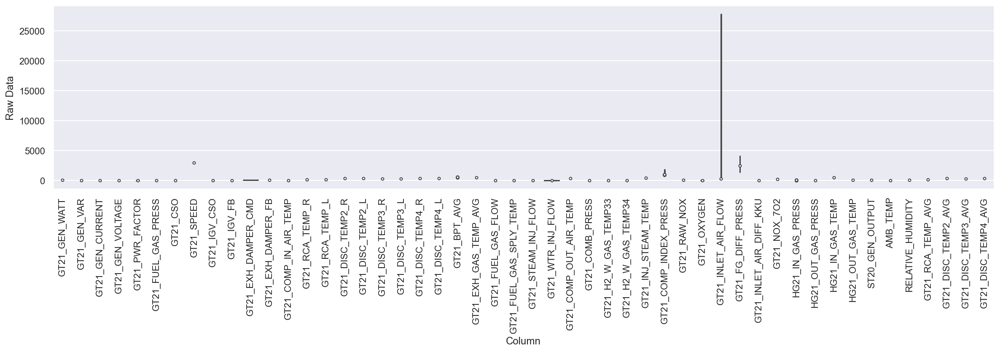

In [9]:
#before normalization 
df_melt = df.melt(var_name='Column', value_name='Raw Data')
#.melt to transform to Long Format (like before pivot table)
plt.figure(figsize=(20, 4))
ax = sns.violinplot(x='Column', y='Raw Data', data=df_melt)
ax.set_xticklabels(df.keys(), rotation=90);

### Gen. and NOx 

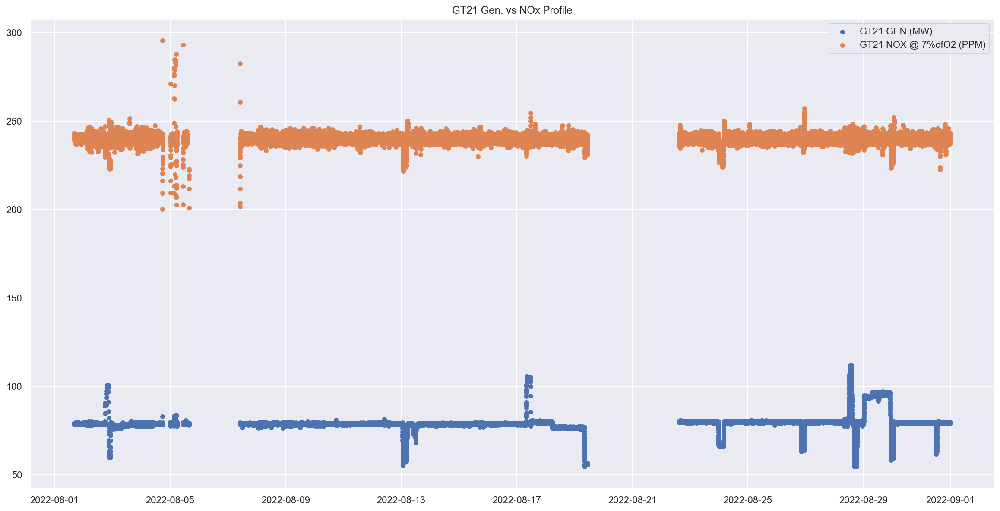

In [10]:
plt.figure(figsize=(20,10))
plt.title('GT21 Gen. vs NOx Profile')
plt.scatter(df.index,df['GT21_GEN_WATT'],s=20,label='GT21 GEN (MW)')
plt.scatter(df.index,df['GT21_NOX_7O2'],s=20,label='GT21 NOX @ 7%ofO2 (PPM)')
plt.legend();

#plt.figure(figsize=(10,5))
#fig, ax = plt.subplots(2,1,sharex=True)
#ax[0].plot(df['GT21_NOX_7O2'], label='GT21 NOX @ 7%ofO2 (PPM)')
#ax[1].plot(df['GT21_GEN_WATT'], label='GT21 GEN (MW)')

### Correlation BEFORE Feature Selection

<AxesSubplot:title={'center':'Correlation BEFORE Features Selection'}>

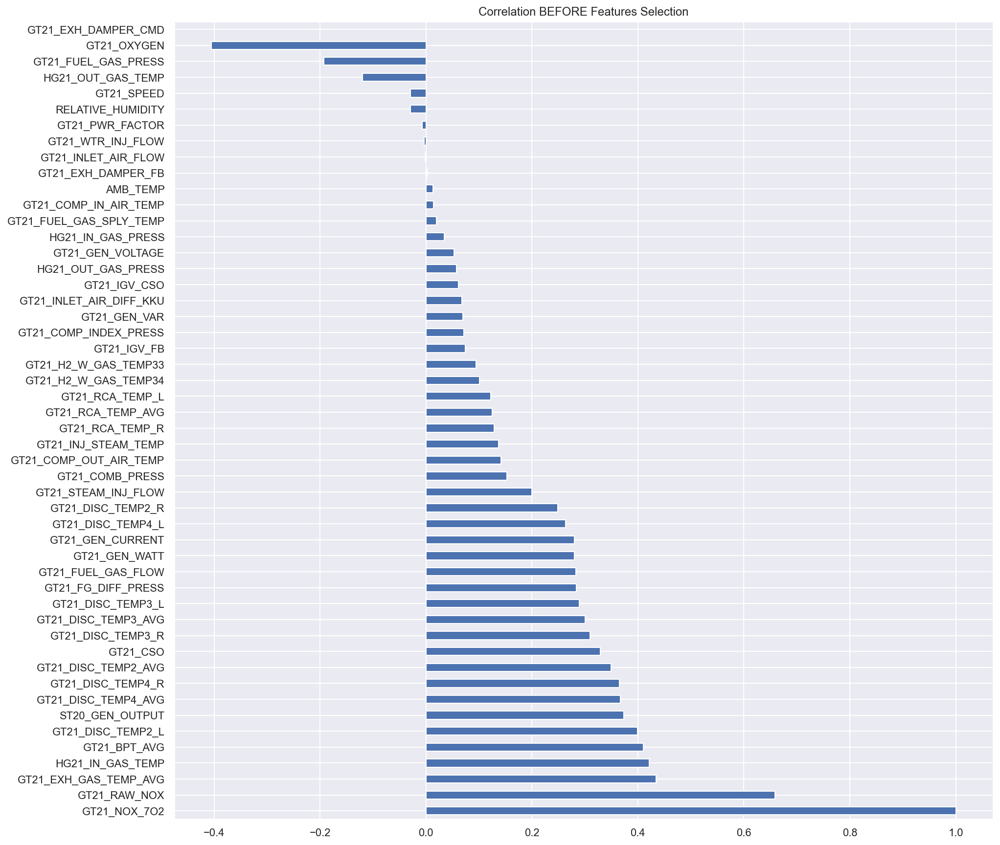

In [11]:
plt.title('Correlation BEFORE Features Selection')
df.corr()['GT21_NOX_7O2'].sort_values(ascending=False).plot(kind='barh',figsize=(15,15))

### Heatamp BEFORE Features Selections

<AxesSubplot:>

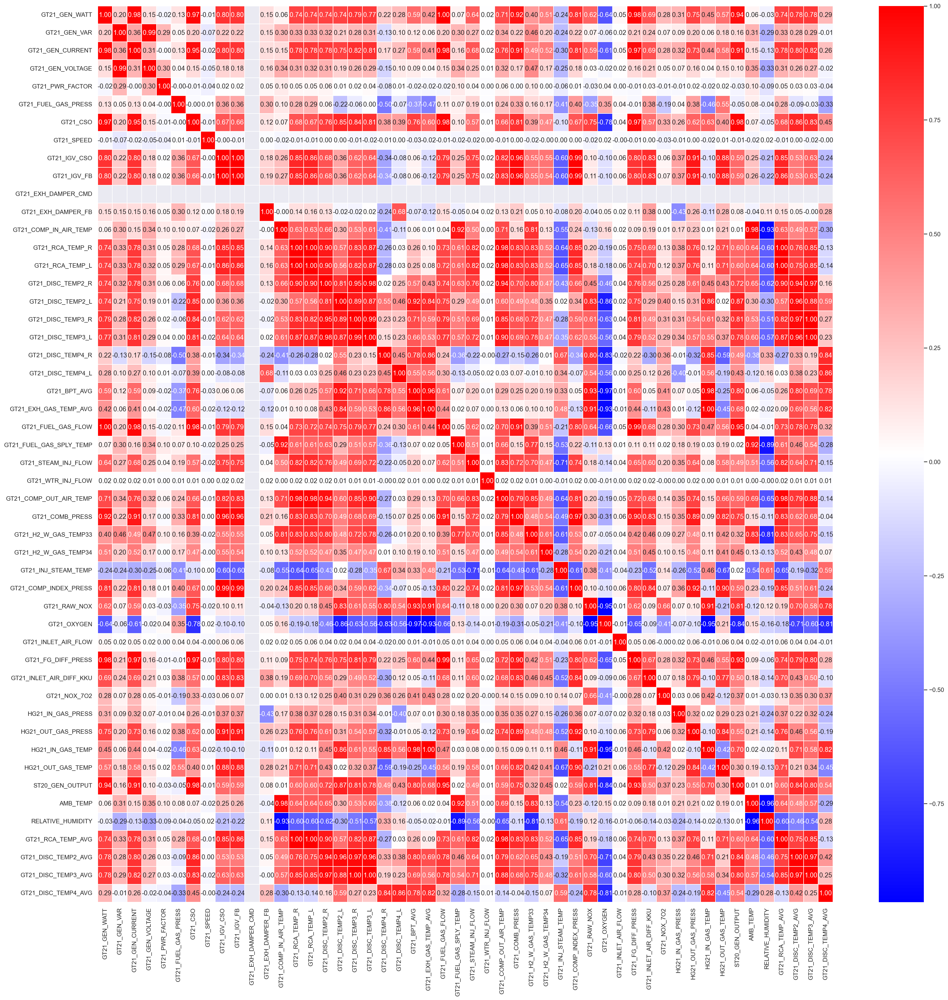

In [12]:
sns.set(rc={'figure.figsize': (30, 30)})
sns.heatmap(df.corr(), cmap ="bwr", annot=True, fmt='.2f', linewidths=0.05)

In [13]:
df.columns

Index(['GT21_GEN_WATT', 'GT21_GEN_VAR', 'GT21_GEN_CURRENT', 'GT21_GEN_VOLTAGE',
       'GT21_PWR_FACTOR', 'GT21_FUEL_GAS_PRESS', 'GT21_CSO', 'GT21_SPEED',
       'GT21_IGV_CSO', 'GT21_IGV_FB', 'GT21_EXH_DAMPER_CMD',
       'GT21_EXH_DAMPER_FB', 'GT21_COMP_IN_AIR_TEMP', 'GT21_RCA_TEMP_R',
       'GT21_RCA_TEMP_L', 'GT21_DISC_TEMP2_R', 'GT21_DISC_TEMP2_L',
       'GT21_DISC_TEMP3_R', 'GT21_DISC_TEMP3_L', 'GT21_DISC_TEMP4_R',
       'GT21_DISC_TEMP4_L', 'GT21_BPT_AVG', 'GT21_EXH_GAS_TEMP_AVG',
       'GT21_FUEL_GAS_FLOW', 'GT21_FUEL_GAS_SPLY_TEMP', 'GT21_STEAM_INJ_FLOW',
       'GT21_WTR_INJ_FLOW', 'GT21_COMP_OUT_AIR_TEMP', 'GT21_COMB_PRESS',
       'GT21_H2_W_GAS_TEMP33', 'GT21_H2_W_GAS_TEMP34', 'GT21_INJ_STEAM_TEMP',
       'GT21_COMP_INDEX_PRESS', 'GT21_RAW_NOX', 'GT21_OXYGEN',
       'GT21_INLET_AIR_FLOW', 'GT21_FG_DIFF_PRESS', 'GT21_INLET_AIR_DIFF_KKU',
       'GT21_NOX_7O2', 'HG21_IN_GAS_PRESS', 'HG21_OUT_GAS_PRESS',
       'HG21_IN_GAS_TEMP', 'HG21_OUT_GAS_TEMP', 'ST20_GEN_OUTPUT',

## Features Selection 
Manual Selection from HeatMap Correlation

In [14]:
#dropcolumns = ['GT21_EXH_DAMPER_CMD','GT21_EXH_DAMPER_FB','GT21_RAW_NOX', 'GT21_GEN_CURRENT', 
#               'GT21_GEN_VOLTAGE','GT21_FG_DIFF_PRESS', 'GT21_RCA_TEMP_R', 'GT21_RCA_TEMP_L',
#               'GT21_DISC_TEMP2_R', 'GT21_DISC_TEMP2_L','GT21_DISC_TEMP3_R', 'GT21_DISC_TEMP3_L',
#               'GT21_DISC_TEMP4_R', 'GT21_DISC_TEMP4_L', 'GT21_OXYGEN', 'GT21_SPEED',
#               'GT21_WTR_INJ_FLOW', 'GT21_IGV_CSO', 'GT21_INLET_AIR_FLOW']
#df.drop(columns=dropcolumns,inplace=True,errors='ignore')

Selected_Features = ['GT21_GEN_WATT', 'GT21_GEN_VAR', 'GT21_PWR_FACTOR','GT21_FUEL_GAS_PRESS',
                     'GT21_CSO', 'GT21_IGV_FB', 'GT21_COMP_IN_AIR_TEMP', 'GT21_BPT_AVG',
                     'GT21_EXH_GAS_TEMP_AVG', 'GT21_FUEL_GAS_FLOW', 'GT21_FUEL_GAS_SPLY_TEMP', 'GT21_STEAM_INJ_FLOW',
                     'GT21_COMP_OUT_AIR_TEMP', 'GT21_COMB_PRESS', 'GT21_H2_W_GAS_TEMP33', 'GT21_H2_W_GAS_TEMP34',
                     'GT21_INJ_STEAM_TEMP', 'GT21_COMP_INDEX_PRESS', 'GT21_INLET_AIR_DIFF_KKU',
                     'HG21_IN_GAS_PRESS', 'HG21_OUT_GAS_PRESS', 'HG21_IN_GAS_TEMP', 'HG21_OUT_GAS_TEMP', 
                     'ST20_GEN_OUTPUT', 'AMB_TEMP', 'RELATIVE_HUMIDITY', 'GT21_NOX_7O2',
                     'GT21_RCA_TEMP_AVG', 'GT21_DISC_TEMP2_AVG', 'GT21_DISC_TEMP3_AVG', 'GT21_DISC_TEMP4_AVG']

### Correlation AFTER Feature Selection

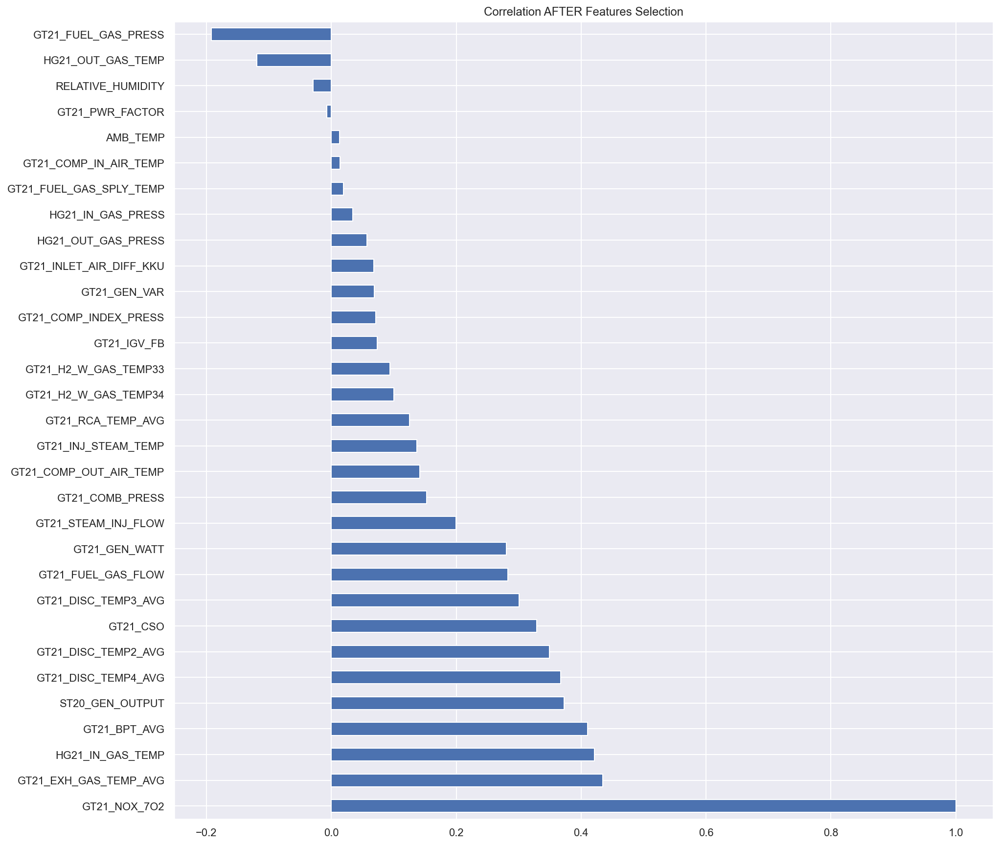

In [15]:
plt.title('Correlation AFTER Features Selection')
df[Selected_Features].corr()['GT21_NOX_7O2'].sort_values(ascending=False).plot(kind='barh',figsize=(15,15));

## Correlation Score

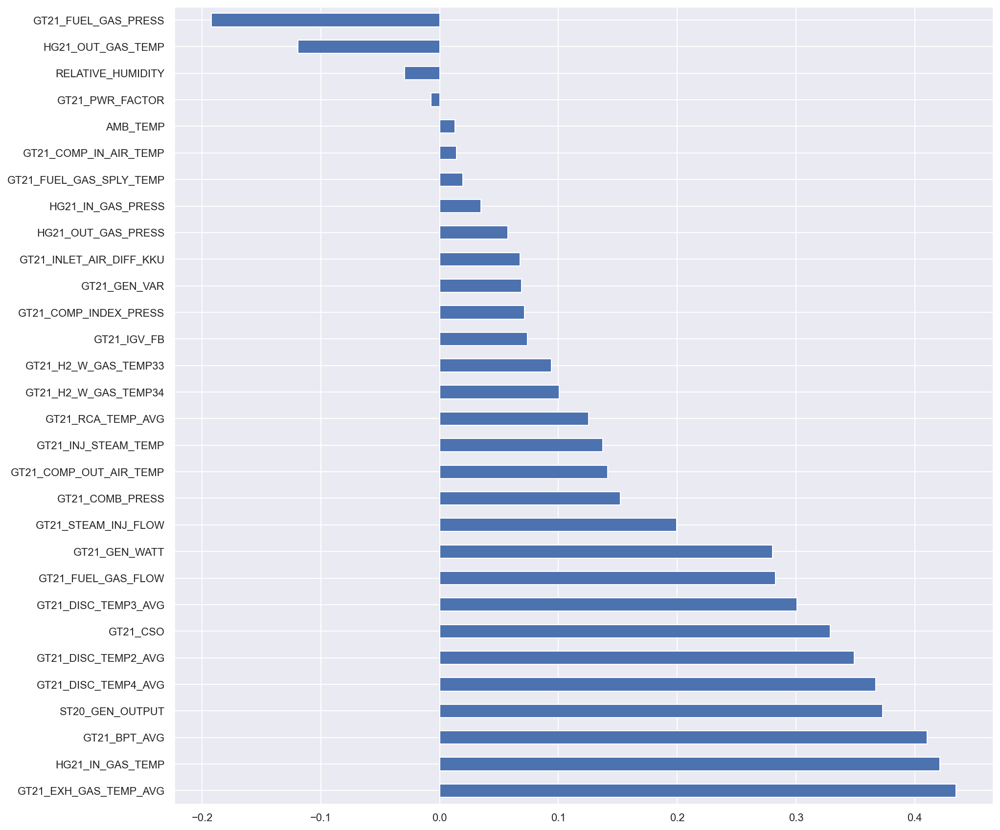

In [16]:
xx = df[Selected_Features].drop('GT21_NOX_7O2', axis=1).apply(lambda x: x.corr(df['GT21_NOX_7O2']))
Result = pd.DataFrame(xx,columns=['Correlation'])
Result['Correlation'].sort_values(ascending=False).plot(kind='barh',figsize=(15,15))
Result = np.abs(Result[['Correlation']])
Result = Result[['Correlation']]*100/Result[['Correlation']].sum()

In [17]:
Result

,Correlation
GT21_GEN_WATT,5.319251
GT21_GEN_VAR,1.312234
GT21_PWR_FACTOR,0.137357
GT21_FUEL_GAS_PRESS,3.653014
GT21_CSO,6.240947
GT21_IGV_FB,1.398710
GT21_COMP_IN_AIR_TEMP,0.269473
GT21_BPT_AVG,7.793561
GT21_EXH_GAS_TEMP_AVG,8.251142
GT21_FUEL_GAS_FLOW,5.367446


# Prediction & Show Feature importance

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error, r2_score
from statistics import stdev, mean
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
import warnings
warnings.filterwarnings('ignore')

In [19]:
# ***** Initial Empty DF *************
empty_list = []
error_tmp = pd.DataFrame(empty_list)
error = pd.DataFrame(empty_list)
predict_all = pd.DataFrame(empty_list)

In [20]:
#Show Feature Importance and Concat Data
def showandconcat(model_name,importance,Result):
    f_imp = pd.DataFrame(importance, index= train.columns,columns=[model_name])
    f_imp.sort_values(by=[model_name],ascending=False)
    
    f_imp.sort_values(by=[model_name],ascending=True).plot(kind='barh',figsize=(10,13))
    title = 'GT21 Features Important from '+model_name
    plt.title(title)
    
    f_imp_p = np.abs(f_imp)*100/np.abs(f_imp).sum()
    Result = pd.concat([Result,f_imp_p],axis=1)
    Result = Result.loc[:,~Result.columns.duplicated()]
    return Result

In [21]:
#Show Testing and Prediction
def showtestpredict(model_name,y_test_org,y_pred_org):
    
    plt.figure(figsize=(20,10))
    plt.title('GT21 NOx Prediction from ' +model_name)
    plt.scatter(test.index,y_test_org,alpha=0.6,label='test')
    plt.scatter(test.index,y_pred_org,alpha=0.6,label='predict')
    plt.xlabel('Date-Time', fontsize=15)
    plt.ylabel('NOx(ppm)', fontsize=15)
    plt.legend()

In [22]:
#Concat DF
def dfconcat(model_name,index_name,in_df,value):
    
    df_tmp = pd.DataFrame(value,columns=[model_name],index=[index_name])
    in_df = pd.concat([in_df,df_tmp],axis=1).drop_duplicates()
    in_df = in_df.loc[:,~in_df.columns.duplicated()]

    return in_df

In [23]:
# to Report and Concat Error Metrics
def error_metrics(model_name,y_test_org,y_pred_org,t_train,t_pred,error):
    
    #mean absolute error
    mae = mean_absolute_error(y_test_org,y_pred_org)
    mae_df = pd.DataFrame(empty_list)
    mae_df = dfconcat(model_name,'MAE(ppm)',mae_df,mae)
    print(f'MAE(ppm) = {mae:0.4f}')
        
    #mean absolute percentage error
    mape = mean_absolute_percentage_error(y_test_org,y_pred_org)*100
    mape_df = pd.DataFrame(empty_list)
    mape_df = dfconcat(model_name,'MAPE(%)',mape_df,mape)
    print(f'MAPE(%) = {mape:0.4f}')
    
    #mean squared error
    mse = mean_squared_error(y_test_org,y_pred_org)
    mse_df = pd.DataFrame(empty_list)
    mse_df = dfconcat(model_name,'MSE',mse_df,mse)
    print(f'MSE = {mse:0.4f}')
    
    #R2
    r2 = r2_score(y_test_org,y_pred_org)
    r2_df = pd.DataFrame(empty_list)
    r2_df = dfconcat(model_name,'R2',r2_df,r2)
    print(f'R2 = {r2:0.4f}')
        
    #error mean,stdev,max,min
    err_abs = abs(y_test_org-y_pred_org)
    err_mean = mean(y_test_org-y_pred_org)
    err_std = stdev(y_test_org-y_pred_org)
    err_max = max(err_abs)
    err_min = min(err_abs)

    err_mean_df = pd.DataFrame(empty_list)
    err_std_df = pd.DataFrame(empty_list)
    err_max_df = pd.DataFrame(empty_list)
    err_min_df = pd.DataFrame(empty_list)
    err_mean_df = dfconcat(model_name,'ERR_Mean(ppm)',err_mean_df,err_mean)
    err_std_df = dfconcat(model_name,'ERR_STDev(ppm)',err_std_df,err_std)
    err_max_df = dfconcat(model_name,'ERR_Max(ppm)',err_max_df,err_max)
    err_min_df = dfconcat(model_name,'ERR_Min(ppm)',err_min_df,err_min)
    print(f'ERR_Mean(ppm) = {err_mean:0.4f}')
    print(f'ERR_STDev(ppm) = {err_std:0.4f}')
    print(f'ERR_Max(ppm) = {err_max:0.4f}')
    print(f'ERR_Min(ppm) = {err_min:0.4f}')
    
    #trining and prediction times
    t_train_df = pd.DataFrame(empty_list)
    t_pred_df = pd.DataFrame(empty_list)
    t_train_df = dfconcat(model_name,'Training_Time(sec)',t_train_df,t_train)
    t_pred_df = dfconcat(model_name,'Predict_Time(sec)',t_pred_df,t_pred)
    print(f'Training_time(sec) = {t_train:0.4f}')
    print(f'Predict_time(sec) = {t_pred:0.4f}')

    error = pd.concat([mae_df, mape_df, mse_df, r2_df, err_mean_df,err_std_df, err_max_df, err_min_df, t_train_df, t_pred_df])
    return error

## Data Standardization (Normalization)
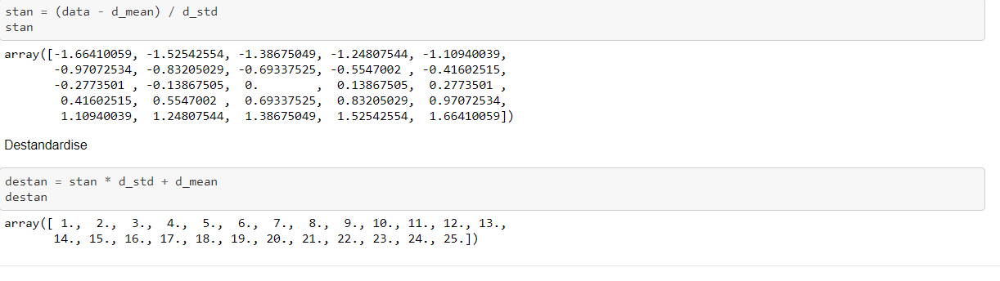

In [24]:
#Prepare Train/Test Data 70:30

train_org, test_org, y_train_org, y_test_org = train_test_split(df[Selected_Features].drop('GT21_NOX_7O2', axis=1), df['GT21_NOX_7O2'], test_size=0.30, random_state=1)

# Standardization
tr_mean = train_org.mean()
tr_std = train_org.std()

train = (train_org - tr_mean)/tr_std
test = (test_org - tr_mean)/tr_std  #use training mean and std


y_train_mean = y_train_org.mean()
y_train_std = y_train_org.std()  

y_train = (y_train_org-y_train_mean)/y_train_std
y_test = (y_test_org-y_train_mean)/y_train_std  #use training mean and std

In [25]:
#Monitor Train Test Ratio
print(f'train shape = {train.shape}')
print(f'test shape = {test.shape}')
print(f'y_train shape = {y_train.shape}')
print(f'y_test shape = {y_test.shape}')

train shape = (24878, 30)
test shape = (10662, 30)
y_train shape = (24878,)
y_test shape = (10662,)


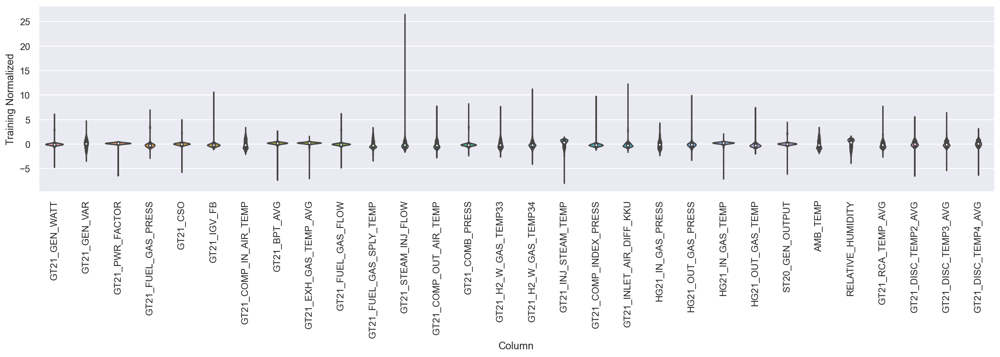

In [26]:
#Training Data after Standardization
df_std_melt = train.melt(var_name='Column', value_name='Training Normalized')
plt.figure(figsize=(20, 4))
ax = sns.violinplot(x='Column', y='Training Normalized', data=df_std_melt)
ax.set_xticklabels(train.keys(), rotation=90);

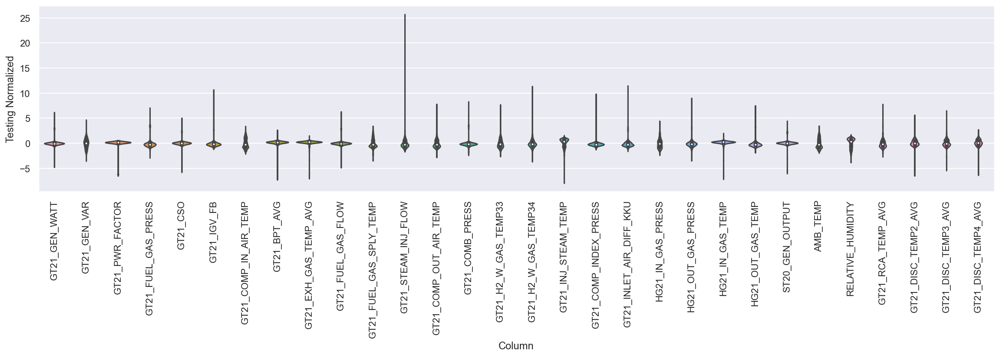

In [27]:
#Testing Data after Standardization
df_std_melt = test.melt(var_name='Column', value_name='Testing Normalized')
plt.figure(figsize=(20, 4))
ax = sns.violinplot(x='Column', y='Testing Normalized', data=df_std_melt)
ax.set_xticklabels(test.keys(), rotation=90);

## Linear Regression 

### Prediction and Error Metric

MAE(ppm) = 1.4546
MAPE(%) = 0.6078
MSE = 5.4043
R2 = 0.2861
ERR_Mean(ppm) = 0.0204
ERR_STDev(ppm) = 2.3247
ERR_Max(ppm) = 42.8875
ERR_Min(ppm) = 0.0001
Training_time(sec) = 0.0279
Predict_time(sec) = 0.0040


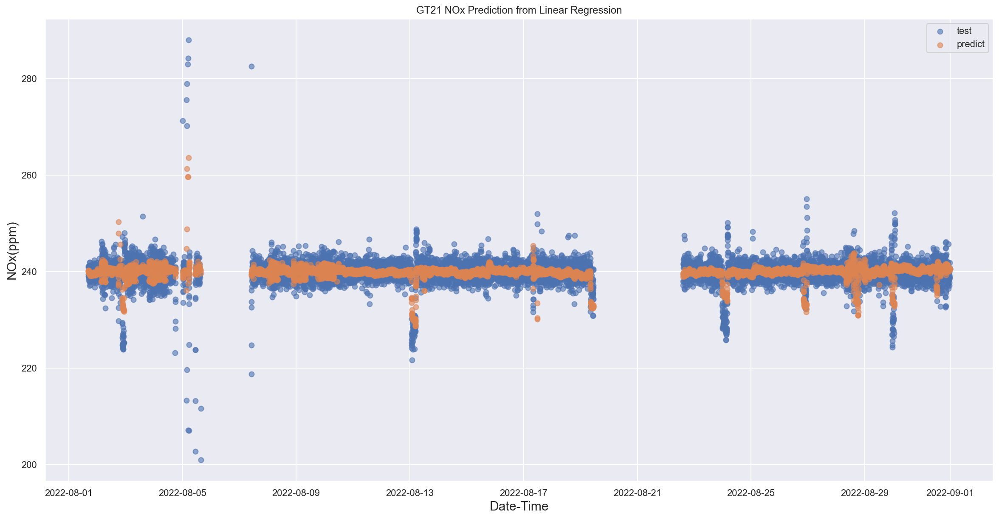

In [28]:
from sklearn.linear_model import LinearRegression

# Modeling
model = LinearRegression()
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)

importance = model.coef_
importance

# Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

# De-standardized
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index)
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
test_df = y_test_org.to_frame(name="Actual") 
predict_df = y_pred_org.to_frame(name="Pred_LinearReg")
predict_all = pd.concat([test_df,predict_df],axis=1)

predict_all['Err_LinearReg'] = predict_all['Actual']-predict_all['Pred_LinearReg']
predict_all['AE_LinearReg'] = abs(predict_all['Err_LinearReg'])
predict_all['APE_LinearReg'] = (predict_all['AE_LinearReg'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('Linear Regression',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

# Show Prediction Graph
showtestpredict('Linear Regression',y_test_org,y_pred_org)

### Error Distribution

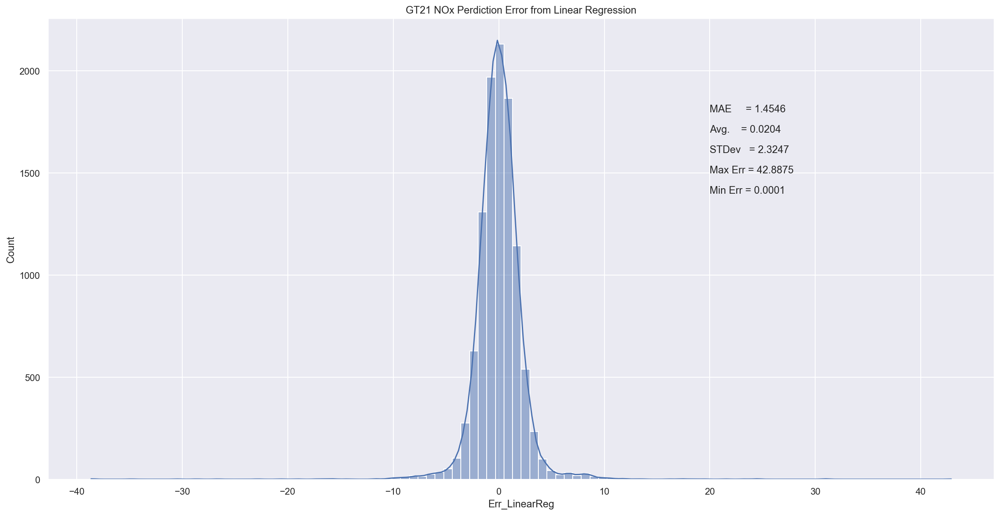

In [29]:
# Show Error Distribution
sns.set(rc={'figure.figsize': (20,10)})
sns.histplot(predict_all['Err_LinearReg'], kde = True, bins=100).set(title="GT21 NOx Perdiction Error from Linear Regression")

model_name = 'Linear Regression'
mae_txt = error.loc['MAE(ppm)'][model_name]
avg_txt = error.loc['ERR_Mean(ppm)'][model_name]
std_txt = error.loc['ERR_STDev(ppm)'][model_name]
max_txt = error.loc['ERR_Max(ppm)'][model_name]
min_txt = error.loc['ERR_Min(ppm)'][model_name]

plt.text(20, 1800,f'MAE     = {mae_txt:0.4f}', size='medium')
plt.text(20, 1700,f'Avg.    = {avg_txt:0.4f}', size='medium')
plt.text(20, 1600,f'STDev   = {std_txt:0.4f}', size='medium')
plt.text(20, 1500,f'Max Err = {max_txt:0.4f}', size='medium')
plt.text(20, 1400,f'Min Err = {min_txt:0.4f}', size='medium')

plt.show()

### Feature Importance

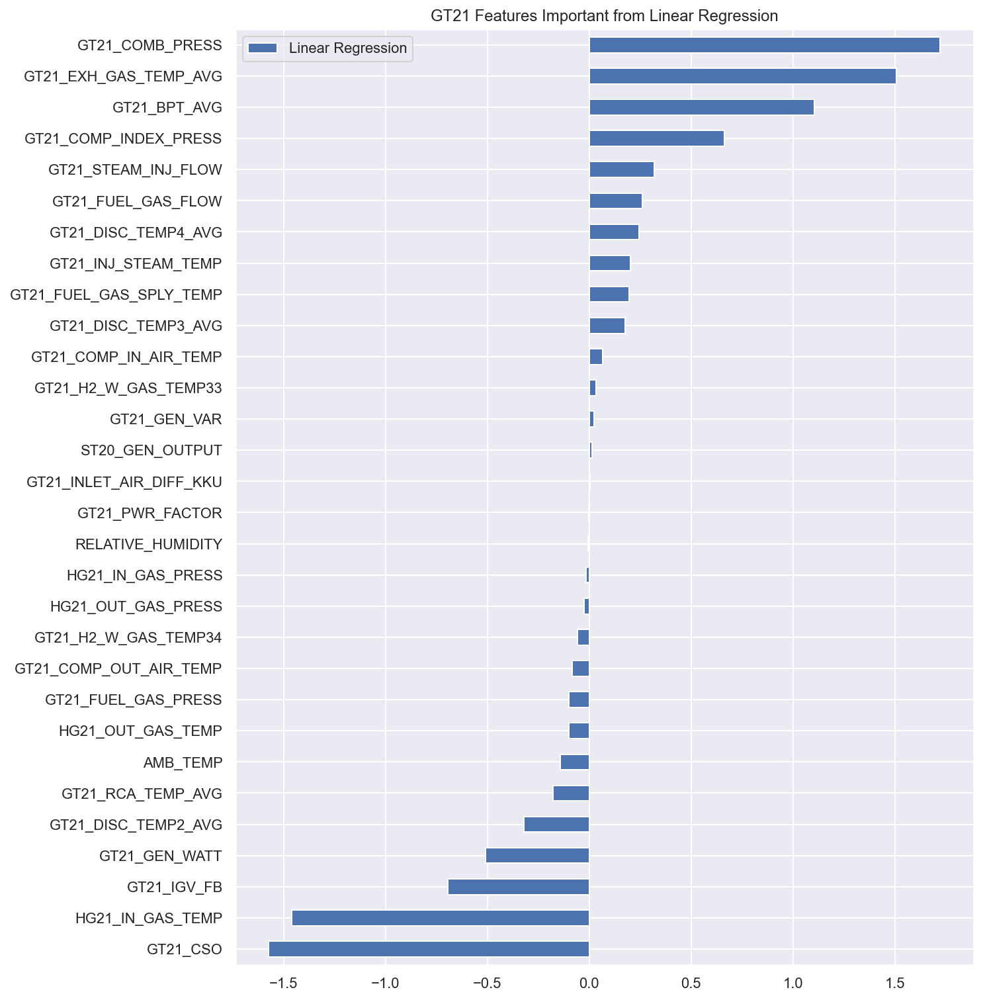

In [30]:
#Feature Importance
Result = showandconcat('Linear Regression',importance,Result)

## Decision Tree

### Prediction and Error Metric

MAE(ppm) = 1.3336
MAPE(%) = 0.5561
MSE = 4.7676
R2 = 0.3702
ERR_Mean(ppm) = 0.0026
ERR_STDev(ppm) = 2.1836
ERR_Max(ppm) = 43.6828
ERR_Min(ppm) = 0.0003
Training_time(sec) = 0.6453
Predict_time(sec) = 0.0070


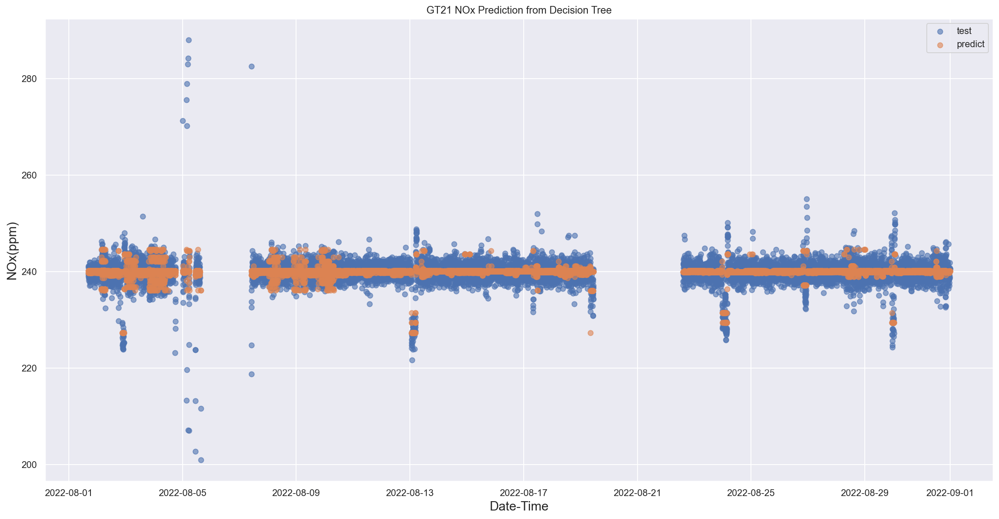

In [31]:
from sklearn.tree import DecisionTreeRegressor

#Modeling
model = DecisionTreeRegressor(criterion='mse',max_depth=8,max_leaf_nodes=100,min_samples_leaf=100,min_samples_split=10)
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)
importance = model.feature_importances_

#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index) 
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_DecisionTree")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_DecisionTree'] = predict_all['Actual']-predict_all['Pred_DecisionTree']
predict_all['AE_DecisionTree'] = abs(predict_all['Err_DecisionTree'])
predict_all['APE_DecisionTree'] = (predict_all['AE_DecisionTree'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('Decision Tree',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

# Show Prediction Graph
showtestpredict('Decision Tree',y_test_org,y_pred_org)

### Error Distribution

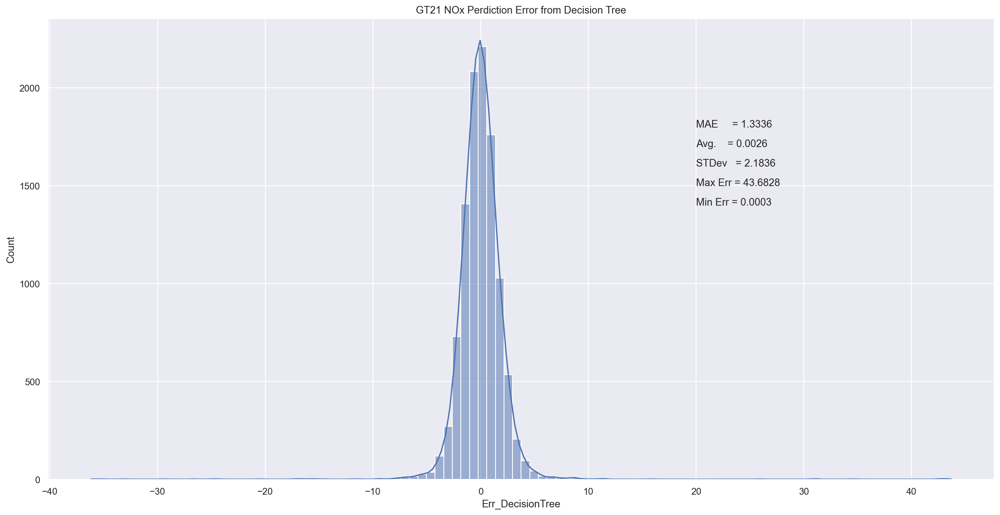

In [32]:
# Show Error Distribution
sns.histplot(predict_all['Err_DecisionTree'], kde = True, bins=100).set(title="GT21 NOx Perdiction Error from Decision Tree")

model_name = 'Decision Tree'
mae_txt = error.loc['MAE(ppm)'][model_name]
avg_txt = error.loc['ERR_Mean(ppm)'][model_name]
std_txt = error.loc['ERR_STDev(ppm)'][model_name]
max_txt = error.loc['ERR_Max(ppm)'][model_name]
min_txt = error.loc['ERR_Min(ppm)'][model_name]

plt.text(20, 1800,f'MAE     = {mae_txt:0.4f}', size='medium')
plt.text(20, 1700,f'Avg.    = {avg_txt:0.4f}', size='medium')
plt.text(20, 1600,f'STDev   = {std_txt:0.4f}', size='medium')
plt.text(20, 1500,f'Max Err = {max_txt:0.4f}', size='medium')
plt.text(20, 1400,f'Min Err = {min_txt:0.4f}', size='medium')

plt.show()

### Feature Importance

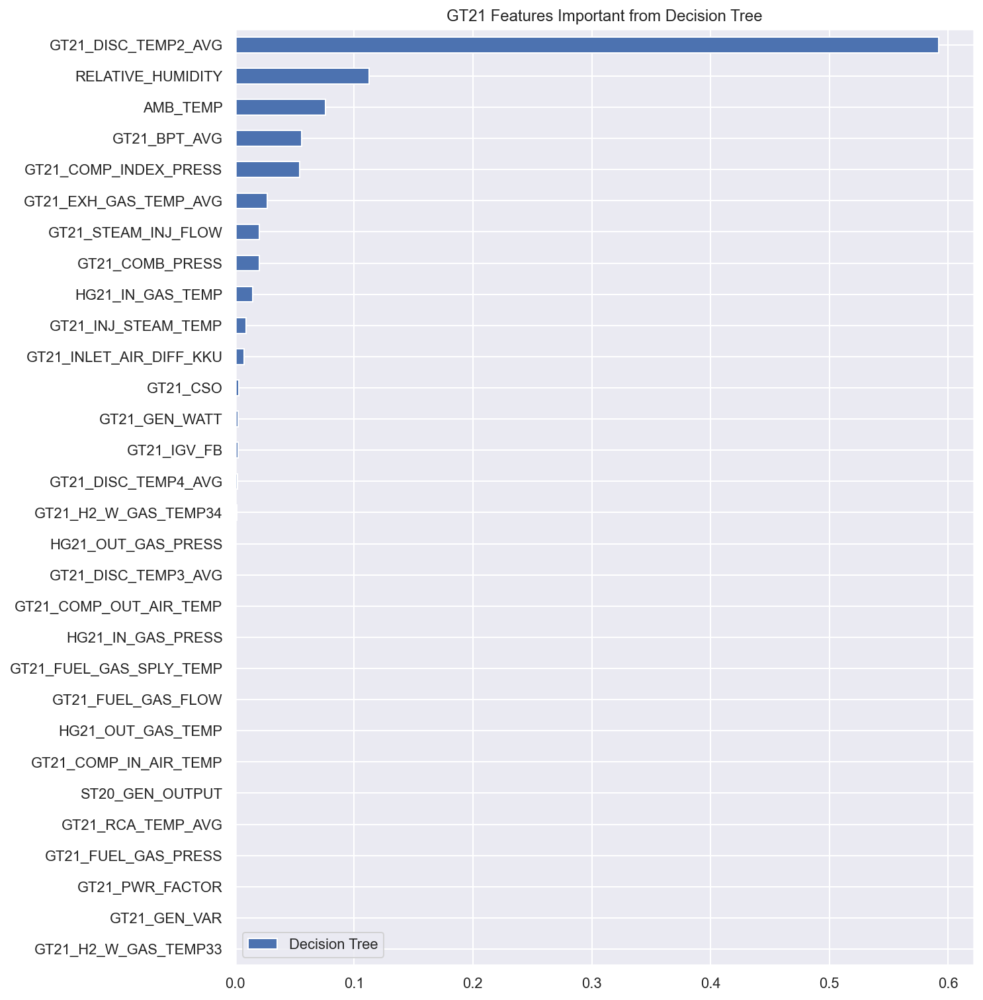

In [33]:
#Feature Importance
Result = showandconcat('Decision Tree',importance,Result)

## Random Forest

### Prediction and Error Metric

MAE(ppm) = 1.1917
MAPE(%) = 0.4973
MSE = 3.1025
R2 = 0.5902
ERR_Mean(ppm) = -0.0017
ERR_STDev(ppm) = 1.7615
ERR_Max(ppm) = 43.7165
ERR_Min(ppm) = 0.0000
Training_time(sec) = 150.4793
Predict_time(sec) = 0.5376


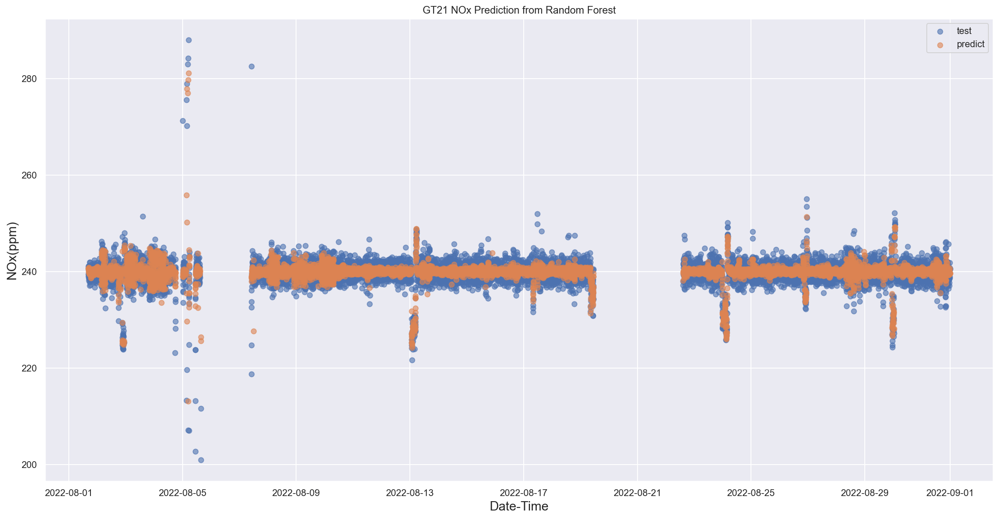

In [34]:
from sklearn.ensemble import RandomForestRegressor

#Modeling
model = RandomForestRegressor()
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)
importance = model.feature_importances_

#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index) 
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_RandomForest")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_RandomForest'] = predict_all['Actual']-predict_all['Pred_RandomForest']
predict_all['AE_RandomForest'] = abs(predict_all['Err_RandomForest'])
predict_all['APE_RandomForest'] = (predict_all['AE_RandomForest'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('Random Forest',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

#Show Prediction Graph
showtestpredict('Random Forest',y_test_org,y_pred_org)

### Error Distribution

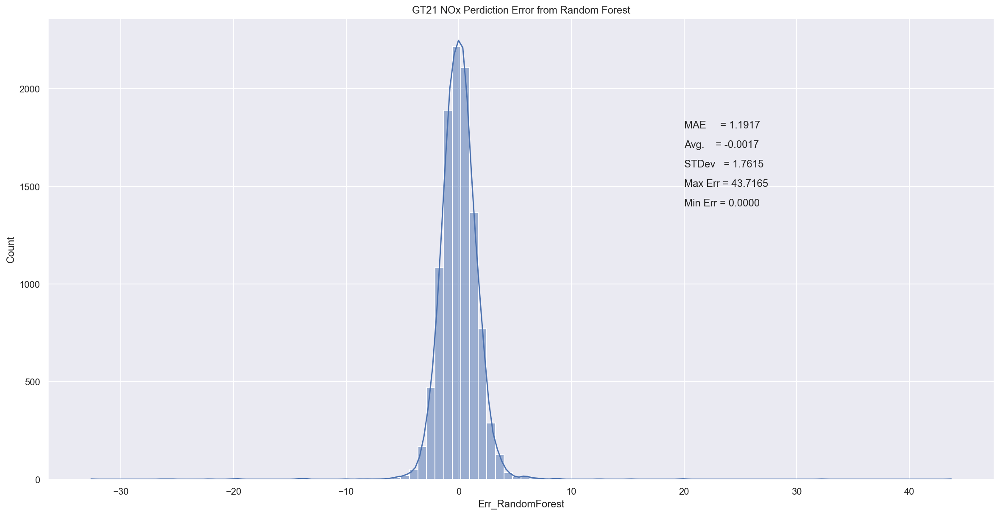

In [35]:
# Show Error Distribution
sns.histplot(predict_all['Err_RandomForest'], kde = True, bins=100).set(title="GT21 NOx Perdiction Error from Random Forest")

model_name = 'Random Forest'
mae_txt = error.loc['MAE(ppm)'][model_name]
avg_txt = error.loc['ERR_Mean(ppm)'][model_name]
std_txt = error.loc['ERR_STDev(ppm)'][model_name]
max_txt = error.loc['ERR_Max(ppm)'][model_name]
min_txt = error.loc['ERR_Min(ppm)'][model_name]

plt.text(20, 1800,f'MAE     = {mae_txt:0.4f}', size='medium')
plt.text(20, 1700,f'Avg.    = {avg_txt:0.4f}', size='medium')
plt.text(20, 1600,f'STDev   = {std_txt:0.4f}', size='medium')
plt.text(20, 1500,f'Max Err = {max_txt:0.4f}', size='medium')
plt.text(20, 1400,f'Min Err = {min_txt:0.4f}', size='medium')

plt.show()

### Feature Importance

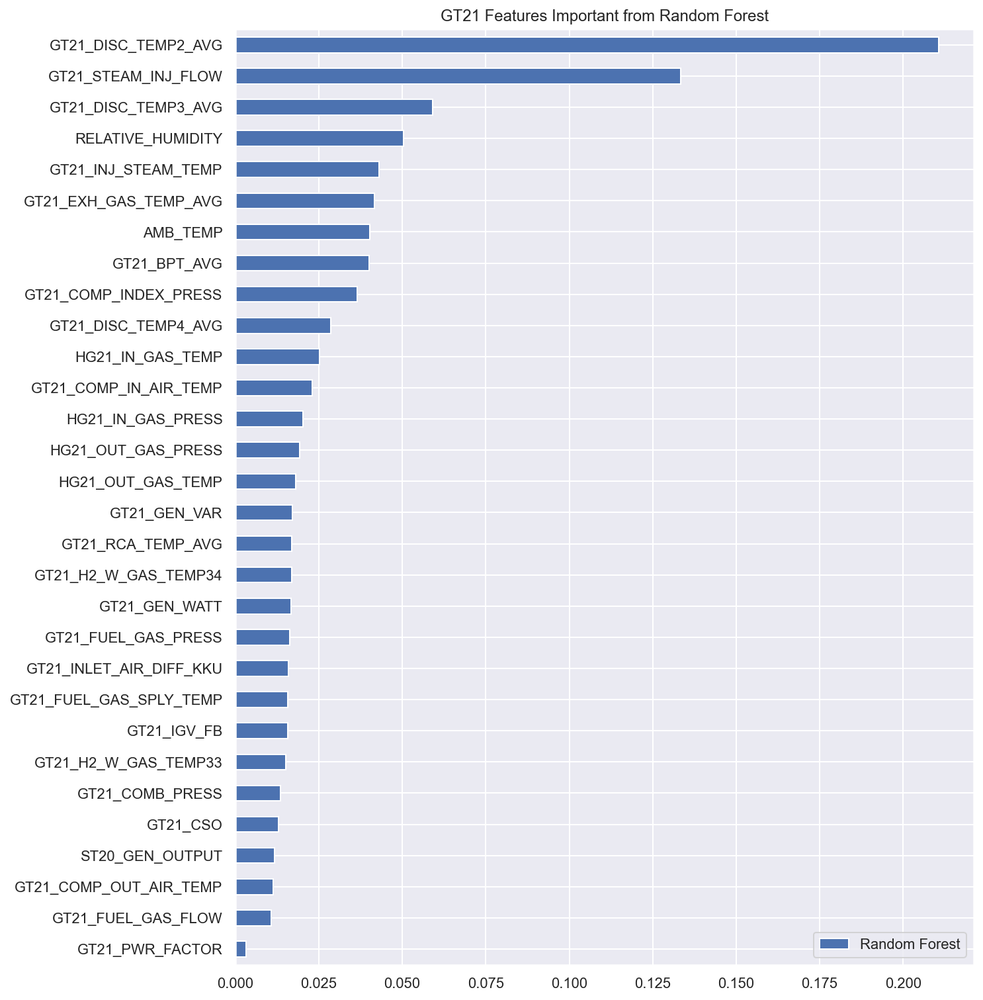

In [36]:
#Feature Importance
Result = showandconcat('Random Forest',importance,Result)

## XGBoost Regression

### Prediction and Error Metric

MAE(ppm) = 1.1997
MAPE(%) = 0.5006
MSE = 3.2680
R2 = 0.5683
ERR_Mean(ppm) = -0.0092
ERR_STDev(ppm) = 1.8078
ERR_Max(ppm) = 44.3928
ERR_Min(ppm) = 0.0002
Training_time(sec) = 5.1114
Predict_time(sec) = 0.0299


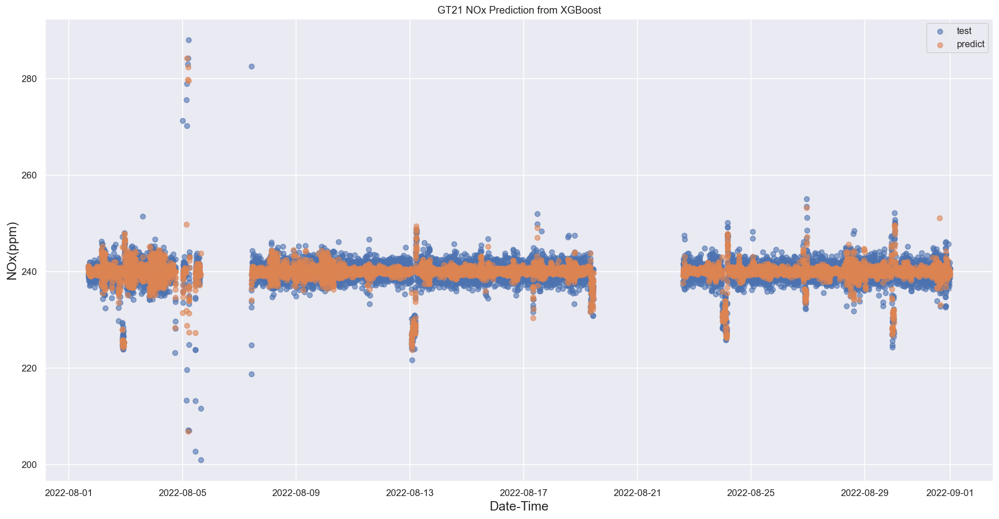

In [37]:
from xgboost import XGBRegressor

#Modeling
model = XGBRegressor()
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)
importance = model.feature_importances_

#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time()-t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index)
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_XGBoost")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_XGBoost'] = predict_all['Actual']-predict_all['Pred_XGBoost']
predict_all['AE_XGBoost'] = abs(predict_all['Err_XGBoost'])
predict_all['APE_XGBoost'] = (predict_all['AE_XGBoost'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('XGBoost',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

# Show Prediction Graph
showtestpredict('XGBoost',y_test_org,y_pred_org)

### Error Distribution

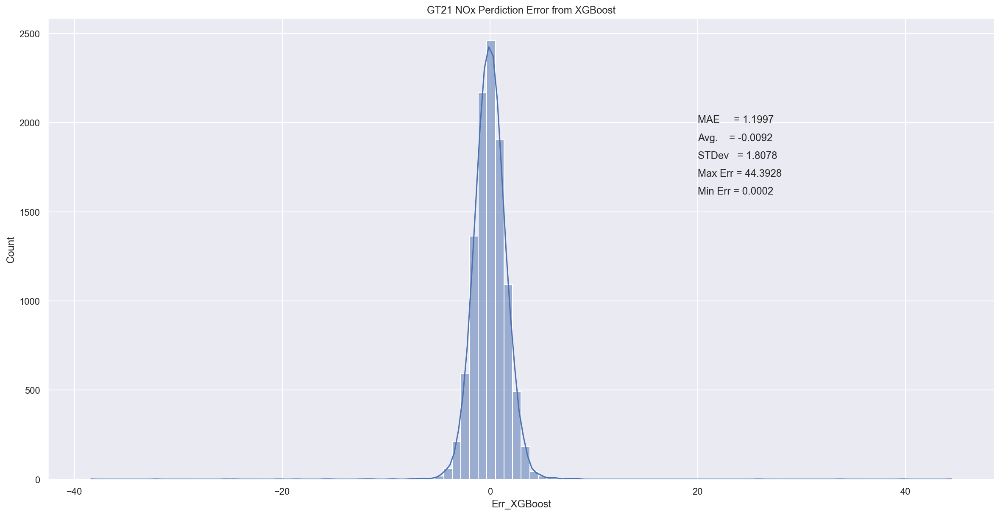

In [38]:
# Show Error Distribution
sns.histplot(predict_all['Err_XGBoost'], kde = True, bins=100).set(title="GT21 NOx Perdiction Error from XGBoost")

model_name = 'XGBoost'
mae_txt = error.loc['MAE(ppm)'][model_name]
avg_txt = error.loc['ERR_Mean(ppm)'][model_name]
std_txt = error.loc['ERR_STDev(ppm)'][model_name]
max_txt = error.loc['ERR_Max(ppm)'][model_name]
min_txt = error.loc['ERR_Min(ppm)'][model_name]

plt.text(20, 2000,f'MAE     = {mae_txt:0.4f}', size='medium')
plt.text(20, 1900,f'Avg.    = {avg_txt:0.4f}', size='medium')
plt.text(20, 1800,f'STDev   = {std_txt:0.4f}', size='medium')
plt.text(20, 1700,f'Max Err = {max_txt:0.4f}', size='medium')
plt.text(20, 1600,f'Min Err = {min_txt:0.4f}', size='medium')

plt.show()

###  Feature Importance

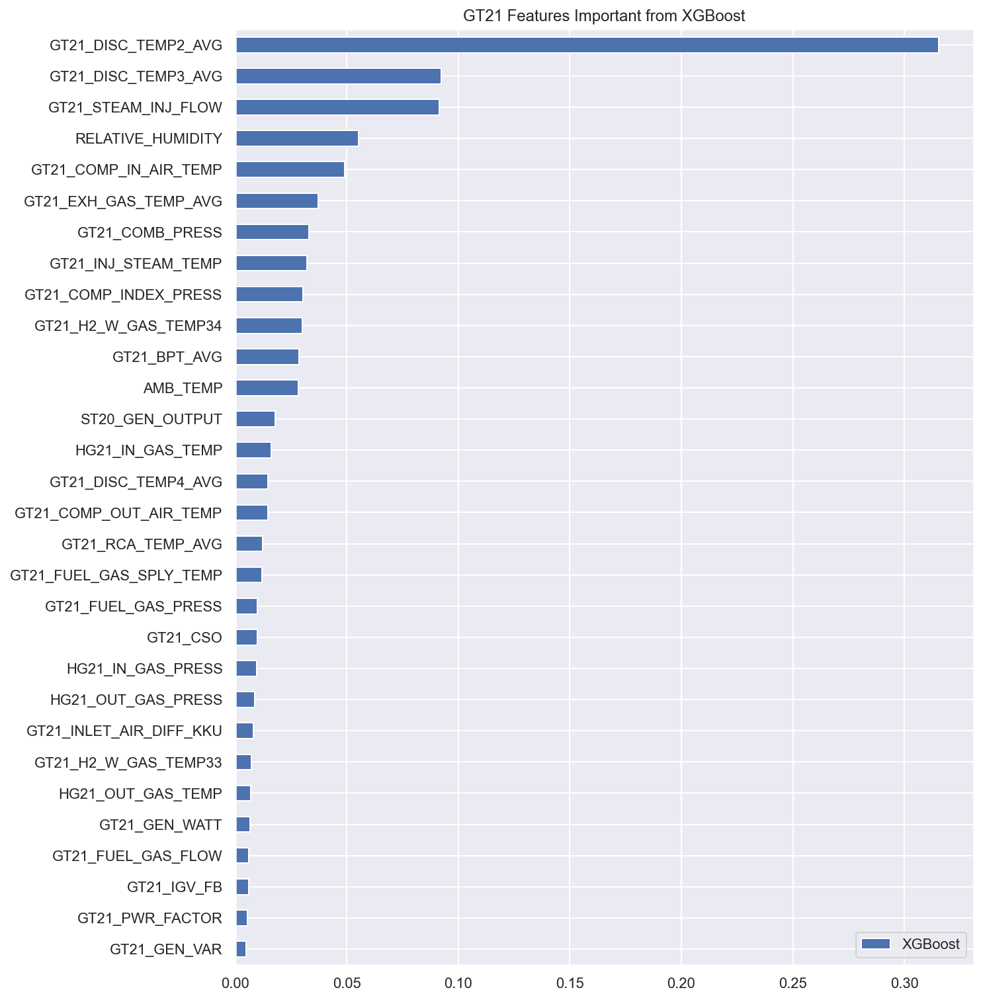

In [39]:
#Feature Importance
Result = showandconcat('XGBoost',importance,Result)

## K-NN Regression

### Prediction and Error Metric

MAE(ppm) = 1.2906
MAPE(%) = 0.5379
MSE = 3.9261
R2 = 0.4814
ERR_Mean(ppm) = 0.0093
ERR_STDev(ppm) = 1.9815
ERR_Max(ppm) = 45.3547
ERR_Min(ppm) = 0.0005
Training_time(sec) = 0.0060
Predict_time(sec) = 8.1846


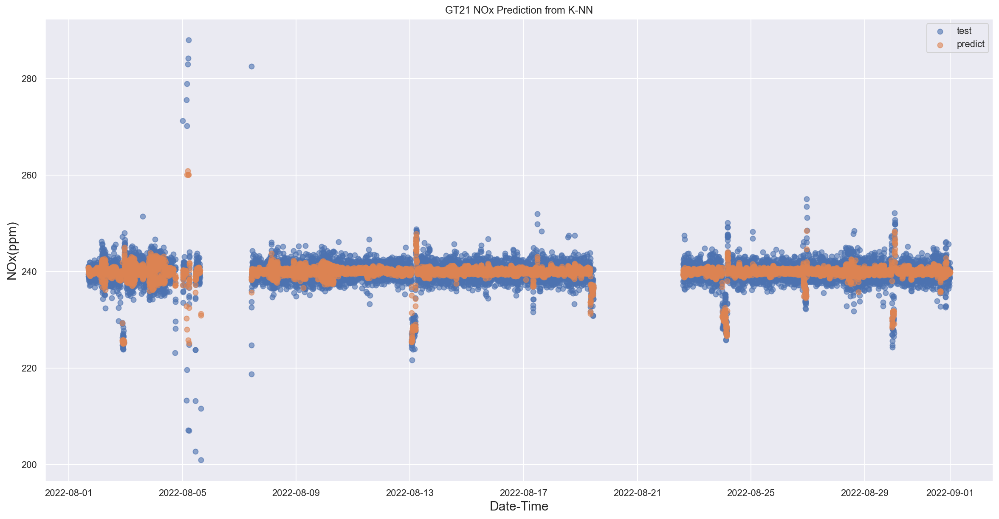

In [40]:
from sklearn.neighbors import KNeighborsRegressor

#Modeling
model = KNeighborsRegressor(n_neighbors= 19)
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)

#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index) 
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_KNN")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_KNN'] = predict_all['Actual']-predict_all['Pred_KNN']
predict_all['AE_KNN'] = abs(predict_all['Err_KNN'])
predict_all['APE_KNN'] = (predict_all['AE_KNN'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('K-NN',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

#Show Prediction Graph
showtestpredict('K-NN',y_test_org,y_pred_org)

### Error Distribution

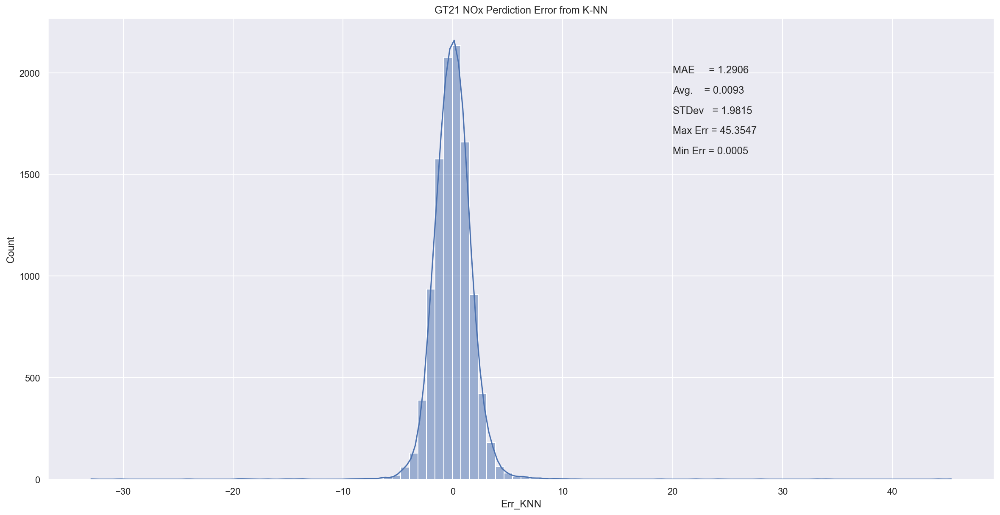

In [41]:
# Show Error Distribution
sns.histplot(predict_all['Err_KNN'], kde = True, bins=100).set(title="GT21 NOx Perdiction Error from K-NN")

model_name = 'K-NN'
mae_txt = error.loc['MAE(ppm)'][model_name]
avg_txt = error.loc['ERR_Mean(ppm)'][model_name]
std_txt = error.loc['ERR_STDev(ppm)'][model_name]
max_txt = error.loc['ERR_Max(ppm)'][model_name]
min_txt = error.loc['ERR_Min(ppm)'][model_name]

plt.text(20, 2000,f'MAE     = {mae_txt:0.4f}', size='medium')
plt.text(20, 1900,f'Avg.    = {avg_txt:0.4f}', size='medium')
plt.text(20, 1800,f'STDev   = {std_txt:0.4f}', size='medium')
plt.text(20, 1700,f'Max Err = {max_txt:0.4f}', size='medium')
plt.text(20, 1600,f'Min Err = {min_txt:0.4f}', size='medium')

plt.show()

### Feature Importance

Permu_time(sec) = 3192.5156


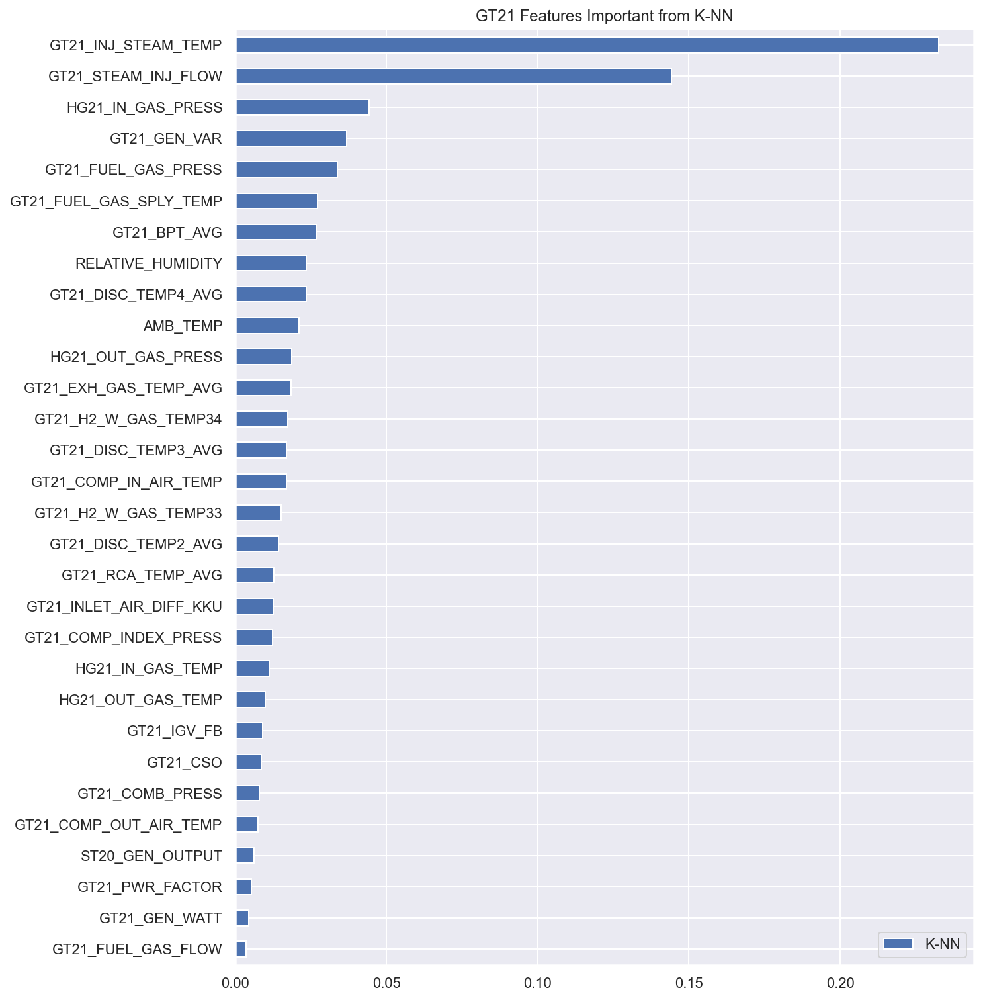

In [42]:
#Feature Importance Calculation
t0 = time.time()
results = permutation_importance(model, train, y_train, scoring='neg_mean_squared_error')
importance = results.importances_mean
t_permu = (time.time()-t0)
print(f'Permu_time(sec) = {t_permu:0.4f}')

#Feature Importance
Result = showandconcat('K-NN',importance,Result)

## Neural Network (Regression)

### Modeling

In [43]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=128, activation='relu', input_shape=(len(Selected_Features)-1,)),
    tf.keras.layers.Dense(units=128, activation='relu'),
    tf.keras.layers.Dense(units=128, activation='relu'),
#     tf.keras.layers.Dense(units=512, activation='relu'),
#     tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=1)
#     tf.keras.layers.Dense(units=len(outputs), activation='softmax'),
])

# For Regression
model.compile(loss='mean_absolute_error', optimizer=tf.optimizers.Adam(), metrics=['mean_absolute_error'])

train_np = np.array(train).reshape(-1,len(Selected_Features)-1)
y_train_np = np.array(y_train)

#Modeling
t0 = time.time()
model.fit(train_np,y_train_np,epochs=100,verbose=2)
t_train = (time.time() - t0)

Epoch 1/100
778/778 - 3s - loss: 0.5224 - mean_absolute_error: 0.5224 - 3s/epoch - 4ms/step
Epoch 2/100
778/778 - 1s - loss: 0.4958 - mean_absolute_error: 0.4958 - 1s/epoch - 2ms/step
Epoch 3/100
778/778 - 2s - loss: 0.4825 - mean_absolute_error: 0.4825 - 2s/epoch - 2ms/step
Epoch 4/100
778/778 - 1s - loss: 0.4746 - mean_absolute_error: 0.4746 - 1s/epoch - 2ms/step
Epoch 5/100
778/778 - 1s - loss: 0.4681 - mean_absolute_error: 0.4681 - 1s/epoch - 2ms/step
Epoch 6/100
778/778 - 2s - loss: 0.4626 - mean_absolute_error: 0.4626 - 2s/epoch - 2ms/step
Epoch 7/100
778/778 - 2s - loss: 0.4604 - mean_absolute_error: 0.4604 - 2s/epoch - 2ms/step
Epoch 8/100
778/778 - 2s - loss: 0.4574 - mean_absolute_error: 0.4574 - 2s/epoch - 2ms/step
Epoch 9/100
778/778 - 1s - loss: 0.4564 - mean_absolute_error: 0.4564 - 1s/epoch - 2ms/step
Epoch 10/100
778/778 - 2s - loss: 0.4518 - mean_absolute_error: 0.4518 - 2s/epoch - 2ms/step
Epoch 11/100
778/778 - 1s - loss: 0.4500 - mean_absolute_error: 0.4500 - 1s/epo

Epoch 90/100
778/778 - 2s - loss: 0.3477 - mean_absolute_error: 0.3477 - 2s/epoch - 2ms/step
Epoch 91/100
778/778 - 2s - loss: 0.3473 - mean_absolute_error: 0.3473 - 2s/epoch - 2ms/step
Epoch 92/100
778/778 - 1s - loss: 0.3449 - mean_absolute_error: 0.3449 - 1s/epoch - 2ms/step
Epoch 93/100
778/778 - 2s - loss: 0.3447 - mean_absolute_error: 0.3447 - 2s/epoch - 3ms/step
Epoch 94/100
778/778 - 2s - loss: 0.3426 - mean_absolute_error: 0.3426 - 2s/epoch - 2ms/step
Epoch 95/100
778/778 - 2s - loss: 0.3411 - mean_absolute_error: 0.3411 - 2s/epoch - 2ms/step
Epoch 96/100
778/778 - 2s - loss: 0.3425 - mean_absolute_error: 0.3425 - 2s/epoch - 3ms/step
Epoch 97/100
778/778 - 2s - loss: 0.3396 - mean_absolute_error: 0.3396 - 2s/epoch - 3ms/step
Epoch 98/100
778/778 - 2s - loss: 0.3404 - mean_absolute_error: 0.3404 - 2s/epoch - 2ms/step
Epoch 99/100
778/778 - 2s - loss: 0.3381 - mean_absolute_error: 0.3381 - 2s/epoch - 2ms/step
Epoch 100/100
778/778 - 2s - loss: 0.3382 - mean_absolute_error: 0.338

### Prediction

334/334 [==============================] - 1s 2ms/step
MAE(ppm) = 1.2490
MAPE(%) = 0.5205
MSE = 3.3878
R2 = 0.5525
ERR_Mean(ppm) = 0.0678
ERR_STDev(ppm) = 1.8394
ERR_Max(ppm) = 55.5483
ERR_Min(ppm) = 0.0001
Training_time(sec) = 163.6668
Predict_time(sec) = 1.4656


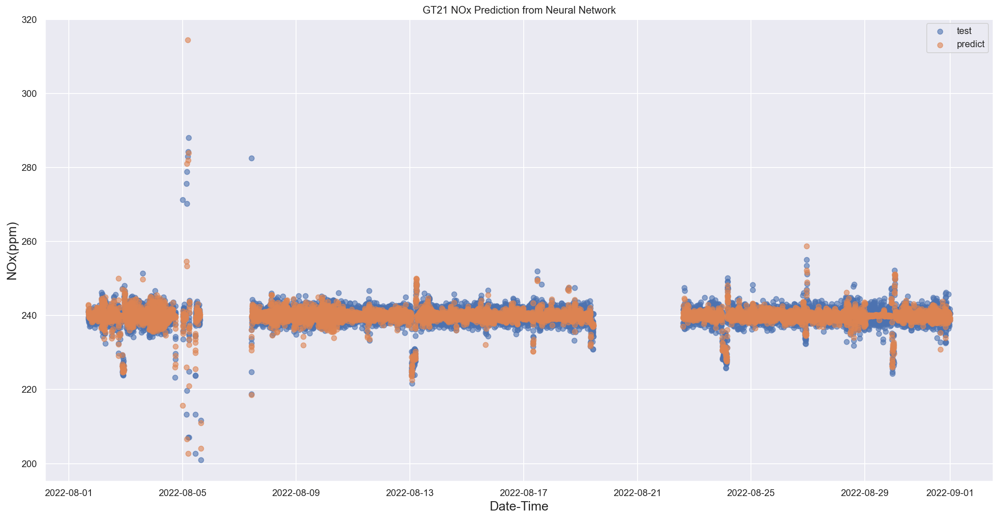

In [44]:
#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index)
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_NN")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_NN'] = predict_all['Actual']-predict_all['Pred_NN']
predict_all['AE_NN'] = abs(predict_all['Err_NN'])
predict_all['APE_NN'] = (predict_all['AE_NN'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('Neural Network',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

#Show Prediction Graph
showtestpredict('Neural Network',y_test_org,y_pred_org)

### Error Distribution

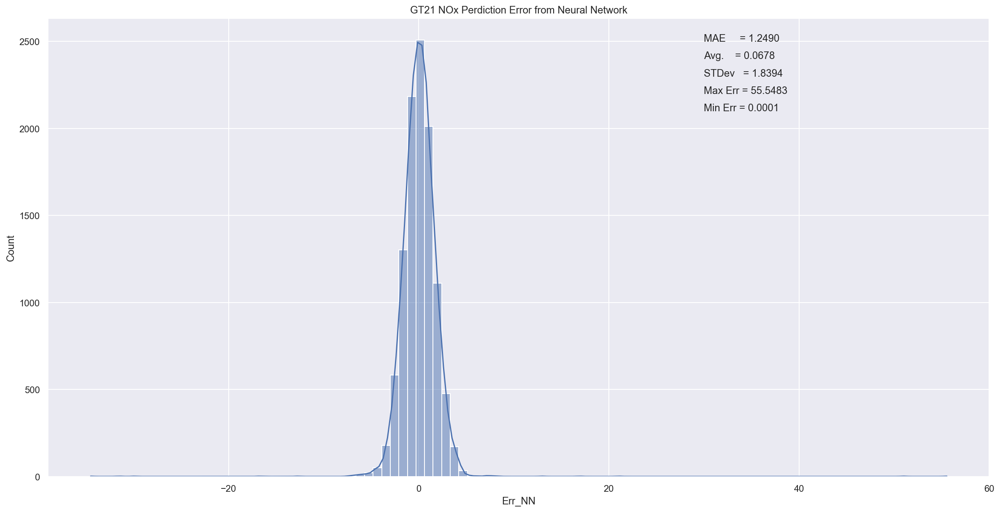

In [45]:
# Show Error Distribution
sns.histplot(predict_all['Err_NN'], kde = True, bins=100).set(title="GT21 NOx Perdiction Error from Neural Network")

model_name = 'Neural Network'
mae_txt = error.loc['MAE(ppm)'][model_name]
avg_txt = error.loc['ERR_Mean(ppm)'][model_name]
std_txt = error.loc['ERR_STDev(ppm)'][model_name]
max_txt = error.loc['ERR_Max(ppm)'][model_name]
min_txt = error.loc['ERR_Min(ppm)'][model_name]

plt.text(30, 2500,f'MAE     = {mae_txt:0.4f}', size='medium')
plt.text(30, 2400,f'Avg.    = {avg_txt:0.4f}', size='medium')
plt.text(30, 2300,f'STDev   = {std_txt:0.4f}', size='medium')
plt.text(30, 2200,f'Max Err = {max_txt:0.4f}', size='medium')
plt.text(30, 2100,f'Min Err = {min_txt:0.4f}', size='medium')

plt.show()

### Feature Importance

778/778 [==============================] - 2s 2ms/step


778/778 [==============================] - 1s 1ms/step
Permu_time(sec) = 250.3417


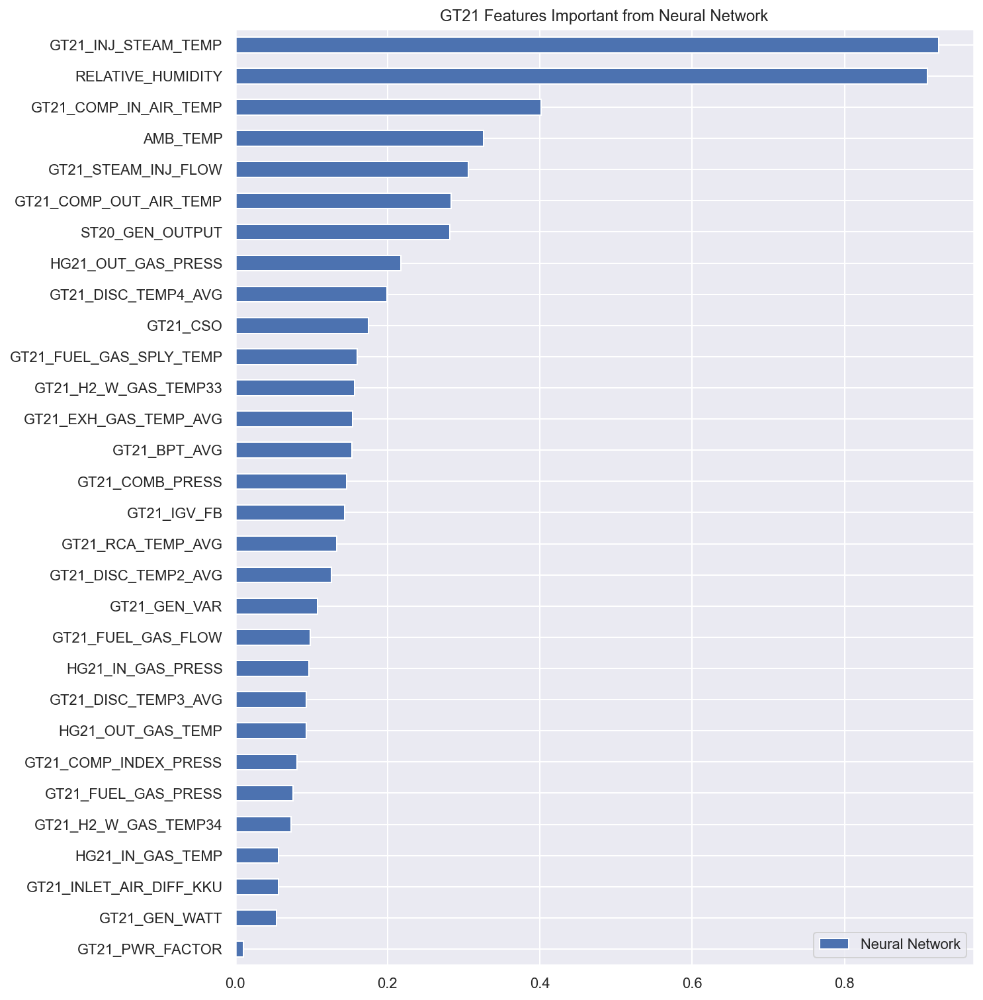

In [46]:
#Permutation Feature Importance
t0 = time.time()
results = permutation_importance(model, train, y_train, scoring='neg_mean_absolute_error')
importance = results.importances_mean
t_permu = (time.time()-t0)
print(f'Permu_time(sec) = {t_permu:0.4f}')

#Feature Importance
Result = showandconcat('Neural Network',importance,Result)

# Show The Result

## Shown Error Metrics

In [47]:
error

,Linear Regression,Decision Tree,Random Forest,XGBoost,K-NN,Neural Network
MAE(ppm),1.454572,1.333585,1.191674,1.199712,1.290550,1.248967
MAPE(%),0.607790,0.556081,0.497333,0.500642,0.537931,0.520527
MSE,5.404338,4.767639,3.102470,3.267963,3.926081,3.387794
R2,0.286067,0.370178,0.590153,0.568290,0.481350,0.552460
ERR_Mean(ppm),0.020418,0.002628,-0.001666,-0.009209,0.009346,0.067776
ERR_STDev(ppm),2.324743,2.183593,1.761465,1.807812,1.981505,1.839434
ERR_Max(ppm),42.887541,43.682800,43.716500,44.392780,45.354737,55.548319
ERR_Min(ppm),0.000107,0.000269,0.000000,0.000187,0.000526,0.000118
Training_Time(sec),0.027924,0.645272,150.479272,5.111392,0.005984,163.666821
Predict_Time(sec),0.003990,0.006981,0.537556,0.029919,8.184641,1.465590


In [48]:
Result.sum()

Correlation          100.0
Linear Regression    100.0
Decision Tree        100.0
Random Forest        100.0
XGBoost              100.0
K-NN                 100.0
Neural Network       100.0
dtype: float64

## Export Error Metrics and Feature Importance

In [49]:
error.to_excel('GT21_Aug22_Error_Result.xlsx')
Result.to_excel('GT21_Aug22_Feature_All.xlsx')
predict_all.to_excel('GT21_Aug22_Predict_All.xlsx')

## Feature Importance average from all Models

<AxesSubplot:>

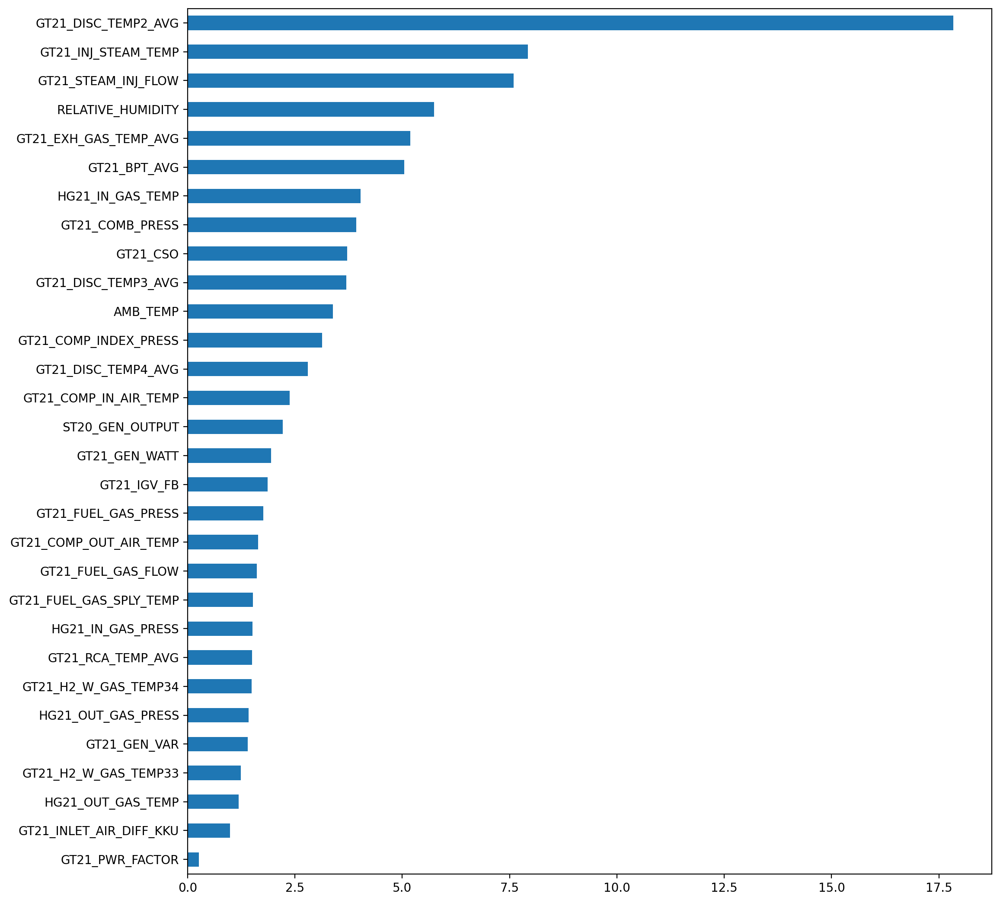

In [50]:
Result['Mean'] = Result.mean(axis=1)
Result['Sum'] = Result.sum(axis=1)-Result['Mean'] #Exclude Mean Column

plt.style.use('default')
Result['Mean'].sort_values().plot(kind='barh',figsize=(12,13))

In [51]:
#Result
Result.sort_values(by=['Mean'],ascending=False)

,Correlation,Linear Regression,Decision Tree,Random Forest,XGBoost,K-NN,Neural Network,Mean,Sum
GT21_DISC_TEMP2_AVG,6.629568,2.723937,59.171181,21.052551,31.524725,1.687368,2.065117,17.836350,124.854447
GT21_INJ_STEAM_TEMP,2.603355,1.726873,0.898550,4.306895,3.218260,27.597630,15.144846,7.928058,55.496408
GT21_STEAM_INJ_FLOW,3.789002,2.708591,2.048151,13.328693,9.142198,17.111901,5.017157,7.592242,53.145694
RELATIVE_HUMIDITY,0.560712,0.059326,11.258071,5.040999,5.534594,2.798119,14.910440,5.737466,40.162263
GT21_EXH_GAS_TEMP_AVG,8.251142,12.774108,2.685244,4.157432,3.705069,2.194428,2.530578,5.185429,36.298002
GT21_BPT_AVG,7.793561,9.365985,5.607577,4.014343,2.859885,3.185605,2.506172,5.047590,35.333128
HG21_IN_GAS_TEMP,7.995298,12.364995,1.481235,2.513955,1.624228,1.331510,0.934663,4.035126,28.245884
GT21_COMB_PRESS,2.891822,14.586095,2.006344,1.362765,3.290844,0.932329,2.404746,3.924992,27.474946
GT21_CSO,6.240947,13.323148,0.276197,1.286723,0.992173,1.010121,2.874551,3.714837,26.003859
GT21_DISC_TEMP3_AVG,5.708785,1.482295,0.000000,5.914953,9.224367,2.000907,1.536378,3.695384,25.867686


## Feature Importance on Box Plot

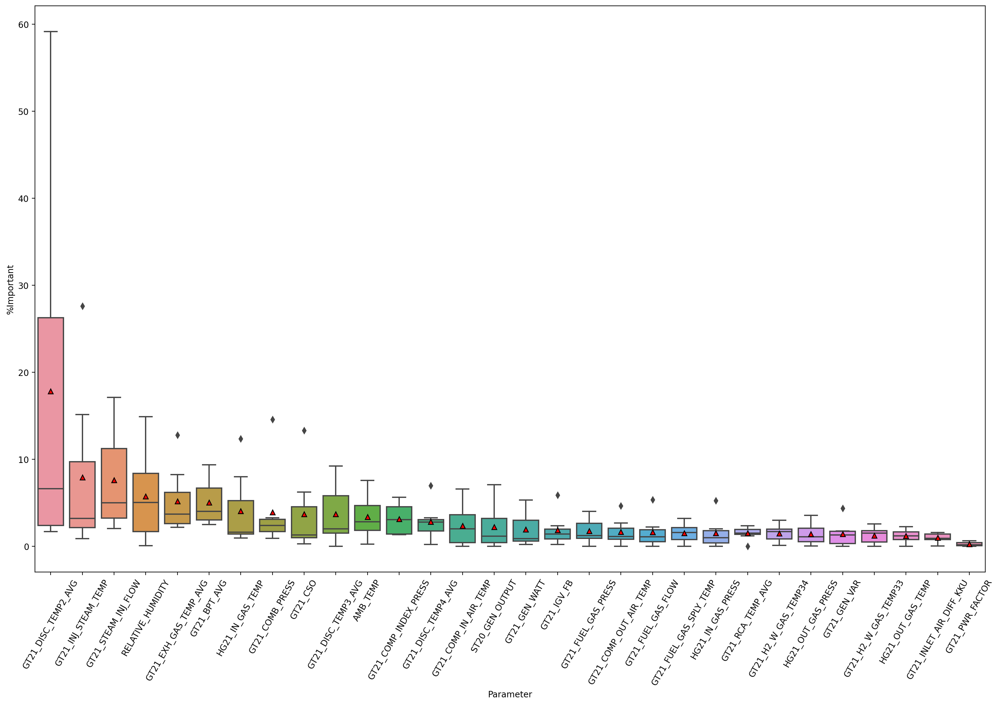

In [52]:
#plt.style.available

Result_T = Result.sort_values(by=['Mean'],ascending=False).drop(columns=['Sum','Mean']).transpose()
# Result_T.plot.hist(bins=60,figsize=(15,6),alpha=0.3)

#before normalization 
Result_T_melt = Result_T.melt(var_name='Parameter', value_name='%Important')
#.melt to transform to Long Format (like before pivot table)
plt.figure(figsize=(20, 12))
ax = sns.boxplot(x='Parameter', y='%Important', data=Result_T_melt,showmeans=True,meanprops={
                       "markerfacecolor":"red", 
                       "markeredgecolor":"black",
                      "markersize":"6"})
ax.set_xticklabels(Result_T.keys(), rotation=60);

## Report All Features 

In [53]:
Des = Result.drop(columns=['Sum','Mean']).transpose().describe()
Des

,GT21_GEN_WATT,GT21_GEN_VAR,GT21_PWR_FACTOR,GT21_FUEL_GAS_PRESS,GT21_CSO,GT21_IGV_FB,GT21_COMP_IN_AIR_TEMP,GT21_BPT_AVG,GT21_EXH_GAS_TEMP_AVG,GT21_FUEL_GAS_FLOW,GT21_FUEL_GAS_SPLY_TEMP,GT21_STEAM_INJ_FLOW,GT21_COMP_OUT_AIR_TEMP,GT21_COMB_PRESS,GT21_H2_W_GAS_TEMP33,GT21_H2_W_GAS_TEMP34,GT21_INJ_STEAM_TEMP,GT21_COMP_INDEX_PRESS,GT21_INLET_AIR_DIFF_KKU,HG21_IN_GAS_PRESS,HG21_OUT_GAS_PRESS,HG21_IN_GAS_TEMP,HG21_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY,GT21_RCA_TEMP_AVG,GT21_DISC_TEMP2_AVG,GT21_DISC_TEMP3_AVG,GT21_DISC_TEMP4_AVG
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000
mean,1.943224,1.403466,0.262881,1.768647,3.714837,1.869695,2.374725,5.047590,5.185429,1.617336,1.524926,7.592242,1.647371,3.924992,1.241026,1.496009,7.928058,3.132158,0.986544,1.515806,1.419586,4.035126,1.191520,2.215341,3.388600,5.737466,1.500916,17.836350,3.695384,2.802749
std,2.035171,1.491564,0.249843,1.498118,4.687845,1.893566,2.506742,2.654616,3.925985,1.814644,1.145887,5.796778,1.559667,4.772178,0.930729,0.984397,9.920436,1.869259,0.530068,1.803271,1.242403,4.409097,0.758179,2.653955,2.504735,5.520063,0.775879,21.485585,3.307469,2.110079
min,0.219066,0.000000,0.000000,0.000000,0.276197,0.216155,0.000000,2.506172,2.194428,0.000000,0.000000,2.048151,0.000000,0.932329,0.000000,0.115806,0.898550,1.332462,0.043579,0.000000,0.045493,0.934663,0.000000,0.000000,0.243988,0.059326,0.000000,1.687368,0.000000,0.197749
25%,0.591861,0.334519,0.075552,0.916827,1.001147,0.835452,0.409453,3.022745,2.607911,0.518049,0.787627,3.248797,0.799186,1.684555,0.500528,0.843622,2.165114,1.411555,0.782364,0.388432,0.544173,1.406372,0.771547,0.420583,1.843190,1.679416,1.361529,2.394527,1.509336,1.766765
50%,0.888095,1.312234,0.181884,1.244062,1.286723,1.398710,1.996256,4.014343,3.705069,1.083398,1.580901,5.017157,1.136377,2.404746,1.519145,1.691821,3.218260,3.050172,0.928470,0.972376,1.087198,1.624228,1.185605,1.166402,2.825771,5.040999,1.519951,6.629568,2.000907,2.777004
75%,2.996219,1.734460,0.434490,2.645584,4.557749,1.967028,3.613084,6.700569,6.204287,1.917204,2.148364,11.235445,2.070831,3.091333,1.796832,1.986655,9.725870,4.549274,1.393194,1.803747,2.075639,5.254627,1.670939,3.209533,4.693734,8.396333,1.943320,26.288638,5.811869,3.070218
max,5.319251,4.374071,0.638198,4.011644,13.323148,5.868041,6.581744,9.365985,12.774108,5.367446,3.221600,17.111901,4.655187,14.586095,2.573315,3.003881,27.597630,5.620814,1.582644,5.253906,3.564787,12.364995,2.270065,7.080754,7.576591,14.910440,2.376763,59.171181,9.224367,6.970524


In [54]:
# Export to Excel
Result[['Mean']].sort_values(['Mean'],ascending=False).to_excel('GT21_Aug22_Feature_Mean.xlsx')

## Pair Plot Top5 Features

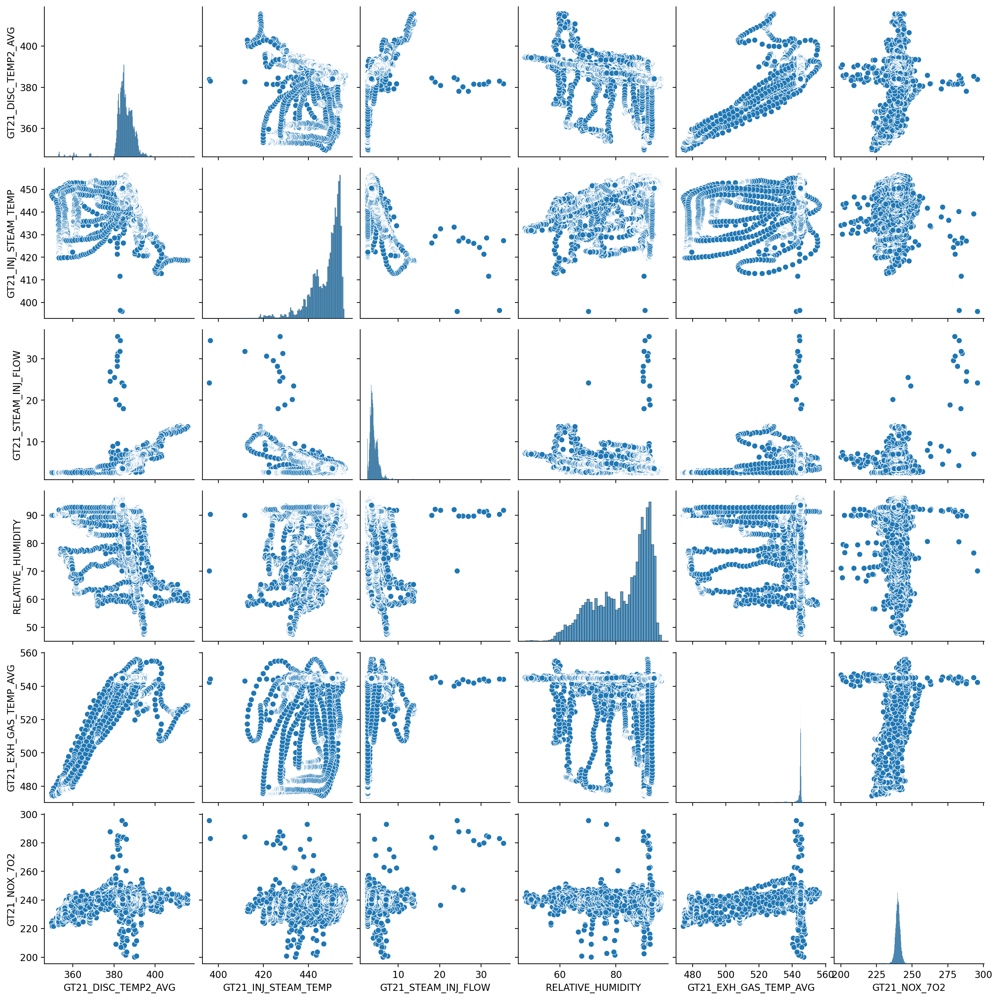

In [55]:
Top = Result[['Mean']].sort_values(['Mean'],ascending=False)
Top5_list = Top.index[0:5]
Top5_df = pd.concat([df[Top5_list],df["GT21_NOX_7O2"]],axis=1)
sns.pairplot(Top5_df);

# Report CPU Info

In [56]:
%load_ext watermark
%watermark

Last updated: 2022-09-12T13:52:57.823103+07:00

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

Compiler    : MSC v.1916 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 142 Stepping 12, GenuineIntel
CPU cores   : 8
Architecture: 64bit

